In [1]:
import os
os.chdir('..')

# IMPORTS

In [2]:
import matplotlib
from matplotlib import rcParams, cycler

# matplotlib.use('Agg')
CUDA_VISIBLE_DEVICES = ""
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
import numpy as np
import random
import json
import copy
import torch
import sklearn
from itertools import cycle
from torch import nn
import os
from src.utils.pool_metrics import get_PCC, get_qc_euclidean, get_batches_euclidean, get_euclidean
from scipy.spatial.distance import cdist, pdist

from sklearn.metrics import silhouette_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.model_selection import StratifiedGroupKFold, StratifiedKFold
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import CCA
try:
    from umap import UMAP
except:
    from umap.umap_ import UMAP

# from src.utils.pool_metrics import log_pool_metrics
from src.utils.batch_effect_removal import get_berm  # , remove_batch_effect
from src.dl.models.pytorch.aedann import ReverseLayerF
from src.dl.models.pytorch.aedann import Encoder2, Decoder2, Classifier, Classifier2, Classifier3, DispAct, MeanAct
from src.dl.models.pytorch.utils.loggings import TensorboardLoggingAE, log_input_ordination, \
    log_confusion_matrix, log_plots
from src.dl.models.pytorch.utils.dataset import get_loaders
from src.utils.utils import scale_data, get_unique_labels, scale_data_per_batch
from src.dl.models.pytorch.utils.utils import get_optimizer, to_categorical, get_empty_dicts, get_empty_traces, \
    log_traces, get_best_loss_from_tb, get_best_acc_from_tb, get_best_values, add_to_logger
from src.dl.models.pytorch.utils.plotting import confidence_ellipse
from src.dl.models.pytorch.utils.stochastic import GaussianSample
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA


import warnings
from datetime import datetime
from sklearn.preprocessing import OneHotEncoder
from tabulate import tabulate

warnings.filterwarnings("ignore")

random.seed(42)
torch.manual_seed(42)
np.random.seed(42)

strategy = 'CU_DEM-AD'
import argparse
parser = argparse.ArgumentParser()
args = parser.parse_args(args=[])
args.csv_file = 'amide_data.csv'
args.remove_zeros = 0
args.bad_batches = ''
args.log1p = 1
args.zinb = 0
args.groupkfold = 1
log_stuff = True
best_correction = False
n_meta = 2
train_models = True


/home/simonp/.local/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/simonp/.local/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/simonp/.local/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarning: The '

In [3]:
from skopt.space import Real, Integer, Categorical
from sklearn.ensemble import RandomForestClassifier
rfc_space = [
    # Integer(100, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Integer(1, 100, 'uniform', name="max_features"),
    Integer(2, 10, 'uniform', name="min_samples_split"),
    Integer(1, 10, 'uniform', name="min_samples_leaf"),
    Integer(1, 1000, 'uniform', name="n_estimators"),
    Categorical(['gini', 'entropy'], name="criterion"),
    Categorical([True, False], name="oob_score"),
    Categorical(['balanced'], name="class_weight"),
]
linsvc_space = [
    # Integer(1, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Real(1e-4, 1, 'log-uniform', name='tol'),
    Integer(1, 1000, 'uniform', name='max_iter'),
    Categorical(['l2'], name='penalty'),
    Real(1e-3, 10000, 'uniform', name='C'),
    Categorical(['balanced'], name='class_weight'),

]
logreg_space = [
    # Integer(1, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Integer(1, 20000, 'uniform', name='max_iter'),
    Real(1e-3, 20000, 'uniform', name='C'),
    Categorical(['saga'], name='solver'),
    Categorical(['l1', 'l2'], name='penalty'),
    Categorical([True, False], name='fit_intercept'),
    Categorical(['balanced'], name='class_weight'),
]


In [4]:
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
def pyGPCA(data, group, name, metrics):
    gPCA = importr('gPCA')

    newdata = robjects.r.matrix(robjects.FloatVector(np.array(data['inputs'][group]).reshape(-1)), nrow=data['inputs'][group].shape[0])
    new_batches = robjects.r.matrix(robjects.IntVector(data['batches'][group]), nrow=data['inputs'][group].shape[0])

    results = gPCA.gPCA_batchdetect(newdata, new_batches)
    # print(results)
    # with localconverter(robjects.default_converter + pandas2ri.converter):
    #     results = np.array(robjects.conversion.rpy2py(results))
    # print(results)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = { key : np.array(robjects.conversion.rpy2py(results.rx2(key))) for key in results.names }

    if 'pool' in name:
        delta_name = 'delta_pool'
        name = name.split('_')[1]
    else:
        delta_name = 'delta'
    if name not in metrics:
        metrics[name] = {}
        # print(results)
    metrics[name][delta_name] = results['delta'][0]
    # metrics[name]['delta.pval'] = results[1]
    return metrics, results

In [5]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.pipeline import Pipeline
minmax_scaler = MinMaxScaler()
standard_scaler = StandardScaler()
robust_scaler = RobustScaler()
standard_minmax_scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
robust_minmax_scaler = Pipeline([('robust', RobustScaler()), ('minmax', MinMaxScaler())])


In [6]:
def log_ORD(ordin, data, uniques, epoch, transductive=False):
    transductive = True

    model = ordin['model']
    model.fit(data['inputs']['all'])
    pcs_all = model.transform(data['inputs']['all'])

    # fig, ax = plt.subplots()
    # fig = plt.figure(figsize=(12, 12))
    pcs_all_df = pd.DataFrame(data=pcs_all, columns=['PC 1', 'PC 2'])
    for name, subnum in list(zip(uniques.keys(), [321, 322, 323, 324, 325, 326])):
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111)
        try:
            ev = model.explained_variance_ratio_
            pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
            pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
        except:
            pc1 = 'Component_1'
            pc2 = 'Component_2'

        ax.set_xlabel(pc1, fontsize=15)
        ax.set_ylabel(pc2, fontsize=15)
        ax.set_title(f"2 component {ordin['name']}", fontsize=20)

        num_targets = len(uniques[name])
        cmap = plt.cm.tab20

        cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
        colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
        colors_list = {name: [] for name in ['all']}
        data1_list = {name: [] for name in ['all']}
        data2_list = {name: [] for name in ['all']}
        new_labels = {name: [] for name in ['all']}
        new_cats = {name: [] for name in ['all']}

        ellipses = []
        unique_cats_train = np.array([])
        for df_name, df, labels in zip(['all'],
                                       [pcs_all_df],
                                       [data[name]['all']]):
            for t, target in enumerate(uniques[name]):
                # final_labels = list(train_labels)
                indices_to_keep = [True if x == target else False for x in list(labels)]
                data1 = list(df.loc[indices_to_keep, 'PC 1'])
                new_labels[df_name] += [target for _ in range(len(data1))]
                new_cats[df_name] += [target for _ in range(len(data1))]

                data2 = list(df.loc[indices_to_keep, 'PC 2'])
                data1_list[df_name] += [data1]
                data2_list[df_name] += [data2]
                colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                    unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                    try:
                        confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                 edgecolor=cols[t],
                                                                 train_set=True)
                        ellipses += [confidence_ellipses[1]]
                    except:
                        pass

        for df_name, marker in zip(list(data1_list.keys()), ['o']):
            data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
            colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
            data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
            data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
            data2 = data_colors_vector[:, 1]
            col = data_colors_vector[:, 2:]
            data1 = data_colors_vector[:, 0]

            ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
            custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
            if uniques[name] == 'pool':
                uniques[name] = 'QC'
            ax.legend(custom_lines, uniques[name].tolist())

        plt.show()
        plt.close()


In [7]:
import copy

def log_ORD(ordin, data, uniques, epoch, transductive=True):
    model = ordin['model']
    data = copy.deepcopy(data)
    for f in ['inputs', 'batches', 'labels']:
        for g in ['train', 'valid', 'test']:
            print(f"{f} {g}")
            data[f][g] = np.concatenate((data[f][g], data[f][f'{g}_pool']))
    if transductive:
        model.fit(np.concatenate((data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'])))
        pcs_train = model.transform(data['inputs']['train'])
        if "transductive" not in ordin['name']:
            ordin['name'] += "_transductive"
    else:
        pcs_train = model.fit_transform(data['inputs']['train'])
    if data['inputs']['valid'] is not None:
        pcs_valid = model.transform(data['inputs']['valid'])
    else:
        pcs_valid = np.array([])
    if data['inputs']['test'] is not None:
        pcs_test = model.transform(data['inputs']['test'])
    else:
        pcs_test = np.array([])
        test_labels = np.array([])
    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['PC 1', 'PC 2'])
    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['PC 1', 'PC 2'])
    pcs_test_df = pd.DataFrame(data=pcs_test, columns=['PC 1', 'PC 2'])
    try:
        ev = model.explained_variance_ratio_
        pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
        pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
    except:
        pc1 = 'Component_1'
        pc2 = 'Component_2'

    for name in list(uniques.keys()):
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111)
        ax.set_xlabel(pc1, fontsize=20)
        ax.set_ylabel(pc2, fontsize=20)
        # ax.set_title(f"2 component {ordin['name']} {name}", fontsize=20)

        # plt.show()

        num_targets = len(uniques[name])
        cmap = plt.cm.tab20

        cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
        colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
        colors_list = {name: [] for name in ['train', 'valid', 'test']}
        data1_list = {name: [] for name in ['train', 'valid', 'test']}
        data2_list = {name: [] for name in ['train', 'valid', 'test']}
        new_labels = {name: [] for name in ['train', 'valid', 'test']}
        new_cats = {name: [] for name in ['train', 'valid', 'test']}

        ellipses = []
        unique_cats_train = np.array([])
        for df_name, df, labels in zip(['train', 'valid', 'test'],
                                       [pcs_train_df, pcs_valid_df, pcs_test_df],
                                       [data[name]['train'], data[name]['valid'], data[name]['test']]):
            for t, target in enumerate(uniques[name]):
                indices_to_keep = [True if x == target else False for x in list(labels)]
                data1 = list(df.loc[indices_to_keep, 'PC 1'])
                new_labels[df_name] += [target for _ in range(len(data1))]
                new_cats[df_name] += [target for _ in range(len(data1))]

                data2 = list(df.loc[indices_to_keep, 'PC 2'])
                data1_list[df_name] += [data1]
                data2_list[df_name] += [data2]
                colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                    unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                    try:
                        confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                 edgecolor=cols[t],
                                                                 train_set=True)
                        ellipses += [confidence_ellipses[1]]
                    except:
                        pass

        for df_name, marker in zip(list(data1_list.keys()), ['o', 'x', '*']):
            data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
            colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
            data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
            data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
            data2 = data_colors_vector[:, 1]
            col = data_colors_vector[:, 2:]
            data1 = data_colors_vector[:, 0]

            ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
            custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
            if 'pool' in uniques[name]:
                uniques[name][np.argwhere(uniques[name] == 'pool')] = 'QC'
            ax.legend(custom_lines, uniques[name].tolist(), fontsize=10)
            # print(data1)

        plt.show()
        plt.close()



In [8]:
    
def log_LDA(ordin, data, uniques, epoch, metrics, model_name):
    for name in list(uniques.keys()):
        skf = sklearn.model_selection.StratifiedKFold(n_splits=5, shuffle=False, random_state=None)
        train_nums = np.arange(0, len(data['labels']['all']))
        scores = []
        # Remove samples from unwanted batches
        for i, (train_inds, valid_inds) in enumerate(skf.split(train_nums, data['labels']['all'], data['batches']['all'])):

            if len(uniques[name]) > 2:
                n_comp = 2
            else:
                n_comp = 1
            model = ordin(n_components=n_comp)
            
            pcs_train = model.fit_transform(data['inputs']['all'].iloc[train_inds], data[name]['all'].iloc[train_inds])
            pcs_valid = model.transform(data['inputs']['all'].iloc[valid_inds])
            scores += [model.score(data['inputs']['all'].iloc[valid_inds], data[name]['all'].iloc[valid_inds])]
            print(i)
            if i == 0:
                fig = plt.figure(figsize=(12, 12))
                ax = fig.add_subplot(111)
                # pcs_train = model.transform(np.concatenate((data['inputs']['train'], data['inputs']['train_pool']), 0))
                # pcs_valid = model.transform(np.concatenate((data['inputs']['valid'], data['inputs']['valid_pool']), 0))
                # pcs_test = model.transform(np.concatenate((data['inputs']['test'], data['inputs']['test_pool']), 0))

                if n_comp > 1:
                    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['LD1', 'LD2'])
                    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['LD1', 'LD2'])
                    # pcs_test_df = pd.DataFrame(data=pcs_test, columns=['LD1', 'LD2'])
                else:
                    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['LD1'])
                    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['LD1'])
                    # pcs_test_df = pd.DataFrame(data=pcs_test, columns=['LD1'])

                try:
                    ev = model.explained_variance_ratio_
                    pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
                    pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
                except:
                    pc1 = 'Component_1'
                    pc2 = 'Component_2'

                ax.set_xlabel(pc1, fontsize=15)
                ax.set_ylabel(pc2, fontsize=15)
                ax.set_title(f"2 component LDA", fontsize=20)

                num_targets = len(uniques[name])
                cmap = plt.cm.tab20

                cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
                colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
                colors_list = {name: [] for name in ['train_data', 'valid_data']}
                data1_list = {name: [] for name in ['train_data', 'valid_data']}
                data2_list = {name: [] for name in ['train_data', 'valid_data']}
                new_labels = {name: [] for name in ['train_data', 'valid_data']}
                new_cats = {name: [] for name in ['train_data', 'valid_data']}

                ellipses = []
                unique_cats_train = np.array([])

                for df_name, df, labels in zip(['train_data', 'valid_data'],
                                               [pcs_train_df, pcs_valid_df],
                                               [data[name]['all'][train_inds], data[name]['all'][valid_inds]]):
                    for t, target in enumerate(uniques[name]):
                        indices_to_keep = [True if x == target else False for x in
                                           list(labels)]  # 0 is the name of the column with target values
                        data1 = list(df.loc[indices_to_keep, 'LD1'])
                        new_labels[df_name] += [target for _ in range(len(data1))]
                        new_cats[df_name] += [target for _ in range(len(data1))]

                        data1_list[df_name] += [data1]
                        colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                        if n_comp > 1:
                            data2 = list(df.loc[indices_to_keep, 'LD2'])
                            data2_list[df_name] += [data2]
                        # if len(indices_to_keep) > 1 and df_name == 'all_data' or target not in unique_cats_train:
                        unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                        if n_comp > 1:
                            try:
                                confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                         edgecolor=cols[t],
                                                                         train_set=True)
                                ellipses += [confidence_ellipses[1]]
                            except:
                                pass

                for df_name, marker in zip(list(data1_list.keys()), ['o', '*']):
                    data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
                    colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
                    if n_comp > 1:
                        data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
                        data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
                        data1 = data_colors_vector[:, 0]
                        data2 = data_colors_vector[:, 1]
                        col = data_colors_vector[:, 2:]
                        ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
                    else:
                        data_colors_vector = np.concatenate((data1_vector, colors_vector), axis=1)
                        data1 = data_colors_vector[:, 0]
                        col = data_colors_vector[:, 1:]
                        ax.scatter(data1, np.random.random(len(data1)), s=50, alpha=1.0, c=col, label=new_labels[df_name],
                                   marker=marker)

                    custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
                    if 'pool' in unique_cats[name]:
                        unique_cats[names][np.argwhere(unique_cats[names] == 'pool')] = 'QC'
                    ax.legend(custom_lines, uniques[name].tolist())

                plt.show()
                plt.close()
                plt.close()
        metrics[model_name]['valid'][f'LDA_score_{name}'] = np.mean(scores)

    return metrics


In [9]:
def log_CCA(ordin, data, unique_cats, epoch):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111)

    model = ordin['model']

    try:
        train_cats = OneHotEncoder().fit_transform(np.stack([np.argwhere(unique_cats == x) for x in train_labels]).reshape(-1, 1)).toarray()
    except:
        pass
    # test_cats = [np.argwhere(unique_cats == x) for x in test_labels]
    # inference_cats = [np.argwhere(unique_cats == x) for x in inference_labels]

    pcs_train, _ = model.fit_transform(data['inputs']['train'], data['cats']['train'])
    pcs_test = model.transform(data['inputs']['valid'])
    pcs_inference = model.transform(data['inputs']['test'])

    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['PC 1', 'PC 2'])
    pcs_test_df = pd.DataFrame(data=pcs_test, columns=['PC 1', 'PC 2'])
    pcs_inference_df = pd.DataFrame(data=pcs_inference, columns=['PC 1', 'PC 2'])
    try:
        ev = model.explained_variance_ratio_
        pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
        pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
    except:
        pc1 = 'Component_1'
        pc2 = 'Component_2'

    ax.set_xlabel(pc1, fontsize=15)
    ax.set_ylabel(pc2, fontsize=15)
    ax.set_title(f"2 component {ordin['name']}", fontsize=20)

    num_targets = len(unique_cats)
    cmap = plt.cm.tab20

    cols = cmap(np.linspace(0, 1, len(unique_cats) + 1))
    colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
    colors_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    data1_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    data2_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    new_labels = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    new_cats = {name: [] for name in ['train_data', 'valid_data', 'test_data']}

    ellipses = []
    unique_cats_train = np.array([])
    for df_name, df, labels in zip(['train_data', 'valid_data', 'test_data'],
                                   [pcs_train_df, pcs_test_df, pcs_inference_df],
                                   [data['labels']['train'], data['labels']['valid'], data['labels']['test']]):
        for t, target in enumerate(unique_cats):
            # final_labels = list(train_labels)
            indices_to_keep = [True if x == target else False for x in
                               list(labels)]  # 0 is the name of the column with target values
            data1 = list(df.loc[indices_to_keep, 'PC 1'])
            new_labels[df_name] += [target for _ in range(len(data1))]
            new_cats[df_name] += [target for _ in range(len(data1))]

            data2 = list(df.loc[indices_to_keep, 'PC 2'])
            data1_list[df_name] += [data1]
            data2_list[df_name] += [data2]
            colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
            if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                try:
                    confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                             edgecolor=cols[t],
                                                             train_set=True)
                    ellipses += [confidence_ellipses[1]]
                except:
                    pass

    for df_name, marker in zip(list(data1_list.keys()), ['o', 'x', '*']):
        data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
        colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
        data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
        data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
        data2 = data_colors_vector[:, 1]
        col = data_colors_vector[:, 2:]
        data1 = data_colors_vector[:, 0]

        ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
        custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(unique_cats) + 1)]
        if 'pool' in unique_cats[name]:
            unique_cats[names][np.argwhere(unique_cats[names] == 'pool')] = 'QC'
        ax.legend(custom_lines, unique_cats.tolist())

    fig.savefig(f'{ordin["name"]}.png')
    plt.close()



In [40]:
def get_amide(path, args, seed=42):
    """
    Args:
        path: Path where data is located.
        args: arguments from the command line to be used in the data getter

    Returns:
        data, unique_labels, unique_batches
    """
    data = {}
    unique_labels = np.array([])
    for info in ['inputs', 'meta', 'names', 'labels', 'cats', 'batches', 'orders', 'sets']:
        data[info] = {}
        for group in ['all', 'train', 'test', 'valid']:
            data[info][group] = np.array([])
    for group in ['train', 'valid']:
        if group == 'valid':
            if args.groupkfold:
                skf = StratifiedGroupKFold(n_splits=3, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                # Remove samples from unwanted batches
                splitter = skf.split(train_nums, data['labels']['train'], data['batches']['train'])
                skf = StratifiedGroupKFold(n_splits=3, shuffle=True, random_state=seed)
                train_nums_pool = np.arange(0, len(data['labels']['train_pool']))
                pool_splitter = skf.split(train_nums_pool, data['labels']['train_pool'],
                                                   data['batches']['train_pool'])

            else:
                skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                splitter = skf.split(train_nums, data['labels']['train']).__next__()
                skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=seed)
                train_nums_pool = np.arange(0, len(data['labels']['train_pool']))
                pool_splitter = skf.split(train_nums_pool, data['labels']['train_pool'])

            _, valid_inds = splitter.__next__()
            _, test_inds = splitter.__next__()
            train_inds = [x for x in train_nums if x not in np.concatenate((valid_inds, test_inds))]

            data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'] = data['inputs']['train'].iloc[train_inds], \
                data['inputs']['train'].iloc[valid_inds], data['inputs']['train'].iloc[test_inds]
            data['meta']['train'], data['meta']['valid'], data['meta']['test'] = data['meta']['train'].iloc[train_inds], \
                data['meta']['train'].iloc[valid_inds], data['meta']['train'].iloc[test_inds]
            data['labels']['train'], data['labels']['valid'], data['labels']['test'] = data['labels']['train'][train_inds], \
                data['labels']['train'][valid_inds], data['labels']['train'][test_inds]
            data['names']['train'], data['names']['valid'], data['names']['test'] = data['names']['train'].iloc[train_inds], \
                data['names']['train'].iloc[valid_inds], data['names']['train'].iloc[test_inds]
            data['orders']['train'], data['orders']['valid'], data['orders']['test'] = data['orders']['train'][train_inds], \
                data['orders']['train'][valid_inds], data['orders']['train'][test_inds]
            data['batches']['train'], data['batches']['valid'], data['batches']['test'] = data['batches']['train'][train_inds], \
                data['batches']['train'][valid_inds], data['batches']['train'][test_inds]
            data['cats']['train'], data['cats']['valid'], data['cats']['test'] = data['cats']['train'][train_inds], data['cats']['train'][
                valid_inds], data['cats']['train'][test_inds]

            _, valid_inds = pool_splitter.__next__()
            _, test_inds = pool_splitter.__next__()
            train_inds = [x for x in train_nums_pool if x not in np.concatenate((valid_inds, test_inds))]
            data['inputs']['train_pool'], data['inputs']['valid_pool'], data['inputs']['test_pool'], = data['inputs']['train_pool'].iloc[train_inds], \
                data['inputs']['train_pool'].iloc[valid_inds], data['inputs']['train_pool'].iloc[test_inds]
            data['meta']['train_pool'], data['meta']['valid_pool'], data['meta']['test_pool'], = data['meta']['train_pool'].iloc[train_inds], \
                data['meta']['train_pool'].iloc[valid_inds], data['meta']['train_pool'].iloc[test_inds]
            data['labels']['train_pool'], data['labels']['valid_pool'], data['labels']['test_pool'], = data['labels']['train_pool'][train_inds], \
                data['labels']['train_pool'][valid_inds], data['labels']['train_pool'][test_inds]
            data['names']['train_pool'], data['names']['valid_pool'], data['names']['test_pool'], = data['names']['train_pool'][train_inds], \
                data['names']['train_pool'][valid_inds], data['names']['train_pool'][test_inds]
            data['orders']['train_pool'], data['orders']['valid_pool'], data['orders']['test_pool'], = data['orders']['train_pool'][train_inds], \
                data['orders']['train_pool'][valid_inds], data['orders']['train_pool'][test_inds]
            data['batches']['train_pool'], data['batches']['valid_pool'], data['batches']['test_pool'], = data['batches']['train_pool'][train_inds], \
                data['batches']['train_pool'][valid_inds], data['batches']['train_pool'][test_inds]
            data['cats']['train_pool'], data['cats']['valid_pool'], data['cats']['test_pool'], = data['cats']['train_pool'][train_inds], data['cats']['train_pool'][
                valid_inds], data['cats']['train_pool'][test_inds]

        else:
            matrix = pd.read_csv(
                f"{path}/amide_data.csv", sep=",", index_col=0
            )
            names = pd.DataFrame(matrix.index).loc[:, 0]
            batches = matrix.loc[:, 'batch']
            labels = matrix.loc[:, 'group']
            orders = matrix.loc[:, 'Injection_order']
            matrix = matrix.iloc[:, 3:].fillna(0)
            if args.remove_zeros:
                mask1 = (matrix == 0).mean(axis=0) < 0.2
                matrix = matrix.loc[:, mask1]
            if args.log1p:
                matrix.iloc[:] = np.log1p(matrix.values)

            def impute_zero(peak):
                zero_mask = peak == 0
                if zero_mask.any():
                    new_x = peak.copy()
                    impute_value = peak.loc[~zero_mask].min()
                    new_x[zero_mask] = impute_value / 2
                    return new_x
                return peak

            if not args.zinb:
                print('Imputing zeros.')
                matrix = matrix.apply(impute_zero, axis=0)
            pool_pos = [i for i, name in enumerate(names.values.flatten()) if 'QC' in name]
            pos = [i for i, name in enumerate(names.values.flatten()) if 'QC' not in name]
            data['inputs'][group] = matrix.iloc[pos]
            data['names'][group] = names
            data['labels'][group] = labels.to_numpy()[pos]
            data['batches'][group] = batches[pos]
            # This is juste to make the pipeline work. Meta should be 0 for the amide dataset
            data['meta'][group] = data['inputs'][group].iloc[:, :2]
            data['orders'][group] = orders[pos]

            data['inputs'][f"{group}_pool"] = matrix.iloc[pool_pos]
            data['names'][f"{group}_pool"] = np.array([f'pool_{i}' for i, _ in enumerate(pool_pos)])
            data['labels'][f"{group}_pool"] = np.array([f'pool' for _ in pool_pos])
            data['batches'][f"{group}_pool"] = batches[pool_pos]

            # This is juste to make the pipeline work. Meta should be 0 for the amide dataset
            data['meta'][f"{group}_pool"] = data['inputs'][f"{group}_pool"].iloc[:, :2]
            data['orders'][f"{group}_pool"] = orders[pool_pos]
            data['cats'][f"{group}_pool"] = np.array(
                [len(np.unique(data['labels'][group])) for _ in batches[pool_pos]])

            data['labels'][group] = np.array([x.split('-')[0] for i, x in enumerate(data['labels'][group])])
            unique_labels = np.concatenate((get_unique_labels(data['labels'][group]), np.array(['pool'])))
            data['cats'][group] = np.array(
                [np.where(x == unique_labels)[0][0] for i, x in enumerate(data['labels'][group])])
    for key in list(data['names'].keys()):
        data['sets'][key] = np.array([key for _ in data['names'][key]])
    for key in list(data.keys()):
        if key in ['inputs', 'meta']:
            data[key]['all'] = pd.concat((
                data[key]['train'], data[key]['valid'], data[key]['test'],
                data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
            data[key]['all_pool'] = pd.concat((
                data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
        else:
            data[key]['all'] = np.concatenate((
                data[key]['train'], data[key]['valid'], data[key]['test'],
                data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
            data[key]['all_pool'] = np.concatenate((
                data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)

    unique_batches = np.unique(data['batches']['all'])
    for group in ['train', 'valid', 'test', 'train_pool', 'valid_pool', 'test_pool', 'all', 'all_pool']:
        data['batches'][group] = np.array([np.argwhere(unique_batches == x)[0][0] for x in data['batches'][group]])

    return data, unique_labels, unique_batches




In [55]:
def get_amide(path, args, seed=42):
    """

    Args:
        path: Path where the csvs can be loaded. The folder designated by path needs to contain at least
                   one file named train_inputs.csv (when using --use_valid=0 and --use_test=0). When using
                   --use_valid=1 and --use_test=1, it must also contain valid_inputs.csv and test_inputs.csv.

    Returns:
        data
    """
    data = {}
    unique_labels = np.array([])
    for info in ['inputs', 'meta', 'names', 'labels', 'cats', 'batches', 'orders']:
        data[info] = {}
        for group in ['all', 'train', 'test', 'valid']:
            data[info][group] = np.array([])
    for group in ['train', 'test', 'valid']:
        if group == 'valid':
            if args.groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                # Remove samples from unwanted batches
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train'],
                                                   data['batches']['train']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train']).__next__()
            data['inputs']['train'], data['inputs']['valid'] = data['inputs']['train'].iloc[train_inds], \
                data['inputs']['train'].iloc[valid_inds]
            data['meta']['train'], data['meta']['valid'] = data['meta']['train'].iloc[train_inds], \
                data['meta']['train'].iloc[valid_inds]
            data['labels']['train'], data['labels']['valid'] = data['labels']['train'][train_inds], \
                data['labels']['train'][valid_inds]
            data['names']['train'], data['names']['valid'] = data['names']['train'].iloc[train_inds], \
                data['names']['train'].iloc[valid_inds]
            data['batches']['train'], data['batches']['valid'] = data['batches']['train'][train_inds], \
                data['batches']['train'][valid_inds]
            data['orders']['train'], data['orders']['valid'] = data['orders']['train'][train_inds], \
                data['orders']['train'][valid_inds]
            data['cats']['train'], data['cats']['valid'] = data['cats']['train'][train_inds], data['cats']['train'][
                valid_inds]

            if args.groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train_pool']))
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train_pool'],
                                                   data['batches']['train_pool']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train_pool']))
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train_pool']).__next__()
            data['inputs']['train_pool'], data['inputs']['valid_pool'] = data['inputs']['train_pool'].iloc[
                train_inds], \
                data['inputs']['train_pool'].iloc[
                    valid_inds]
            data['meta']['train_pool'], data['meta']['valid_pool'] = data['meta']['train_pool'].iloc[
                train_inds], \
                data['meta']['train_pool'].iloc[
                    valid_inds]
            data['labels']['train_pool'], data['labels']['valid_pool'] = data['labels']['train_pool'][train_inds], \
                data['labels']['train_pool'][valid_inds]
            data['names']['train_pool'], data['names']['valid_pool'] = data['names']['train_pool'][train_inds], \
                data['names']['train_pool'][valid_inds]
            data['batches']['train_pool'], data['batches']['valid_pool'] = data['batches']['train_pool'][
                train_inds], \
                data['batches']['train_pool'][valid_inds]
            data['orders']['train_pool'], data['orders']['valid_pool'] = data['orders']['train_pool'][
                train_inds], \
                data['orders']['train_pool'][valid_inds]
            data['cats']['train_pool'], data['cats']['valid_pool'] = data['cats']['train_pool'][train_inds], \
                data['cats']['train_pool'][
                    valid_inds]

        elif group == 'test':
            if args.groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train'],
                                                  data['batches']['train']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train']).__next__()
            data['inputs']['train'], data['inputs']['test'] = data['inputs']['train'].iloc[train_inds], \
                data['inputs']['train'].iloc[test_inds]
            data['meta']['train'], data['meta']['test'] = data['meta']['train'].iloc[train_inds], \
                data['meta']['train'].iloc[test_inds]
            data['names']['train'], data['names']['test'] = data['names']['train'].iloc[train_inds], \
                data['names']['train'].iloc[test_inds]
            data['labels']['train'], data['labels']['test'] = data['labels']['train'][train_inds], \
                data['labels']['train'][test_inds]
            data['batches']['train'], data['batches']['test'] = data['batches']['train'][train_inds], \
                data['batches']['train'][test_inds]
            data['orders']['train'], data['orders']['test'] = data['orders']['train'][train_inds], \
                data['orders']['train'][test_inds]
            data['cats']['train'], data['cats']['test'] = \
                data['cats']['train'][train_inds], data['cats']['train'][test_inds]

            if args.groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train_pool']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train_pool'],
                                                  data['batches']['train_pool']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train_pool']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train_pool']).__next__()
            data['inputs']['train_pool'], data['inputs']['test_pool'] = data['inputs']['train_pool'].iloc[
                train_inds], \
                data['inputs']['train_pool'].iloc[test_inds]
            data['meta']['train_pool'], data['meta']['test_pool'] = data['meta']['train_pool'].iloc[train_inds], \
                data['meta']['train_pool'].iloc[test_inds]
            data['names']['train_pool'], data['names']['test_pool'] = data['names']['train_pool'][train_inds], \
                data['names']['train_pool'][test_inds]
            data['orders']['train_pool'], data['orders']['test_pool'] = data['orders']['train_pool'][train_inds], \
                data['orders']['train_pool'][test_inds]
            data['labels']['train_pool'], data['labels']['test_pool'] = data['labels']['train_pool'][train_inds], \
                data['labels']['train_pool'][test_inds]
            data['batches']['train_pool'], data['batches']['test_pool'] = data['batches']['train_pool'][train_inds], \
                data['batches']['train_pool'][test_inds]
            data['cats']['train_pool'], data['cats']['test_pool'] = \
                data['cats']['train_pool'][train_inds], data['cats']['train_pool'][test_inds]

        else:
            matrix = pd.read_csv(
                f"{path}/amide_data.csv", sep=",", index_col=0
            )
            names = pd.DataFrame(matrix.index).loc[:, 0]
            batches = matrix.loc[:, 'batch']
            labels = matrix.loc[:, 'group']
            orders = matrix.loc[:, 'Injection_order']
            matrix = matrix.iloc[:, 3:].fillna(0)
            if args.remove_zeros:
                mask1 = (matrix == 0).mean(axis=0) < 0.2
                matrix = matrix.loc[:, mask1]
            matrix.iloc[:] = np.log1p(matrix.values)

            def impute_zero(peak):
                zero_mask = peak == 0
                if zero_mask.any():
                    new_x = peak.copy()
                    impute_value = peak.loc[~zero_mask].min()
                    new_x[zero_mask] = impute_value / 2
                    return new_x
                return peak

            if not args.zinb:
                print('Imputing zeros.')
                matrix = matrix.apply(impute_zero, axis=0)
            pool_pos = [i for i, name in enumerate(names.values.flatten()) if 'QC' in name]
            pos = [i for i, name in enumerate(names.values.flatten()) if 'QC' not in name]
            data['inputs'][group] = matrix.iloc[pos]
            data['names'][group] = names
            data['labels'][group] = labels.to_numpy()[pos]
            data['batches'][group] = batches[pos]
            # This is juste to make the pipeline work. Meta should be 0 for the amide dataset
            data['meta'][group] = data['inputs'][group].iloc[:, :2]
            data['orders'][group] = orders[pos]

            data['inputs'][f"{group}_pool"] = matrix.iloc[pool_pos]
            data['names'][f"{group}_pool"] = np.array([f'pool_{i}' for i, _ in enumerate(pool_pos)])
            data['labels'][f"{group}_pool"] = np.array([f'pool' for _ in pool_pos])
            data['batches'][f"{group}_pool"] = batches[pool_pos]

            # This is juste to make the pipeline work. Meta should be 0 for the amide dataset
            data['meta'][f"{group}_pool"] = data['inputs'][f"{group}_pool"].iloc[:, :2]
            data['orders'][f"{group}_pool"] = orders[pool_pos]
            data['cats'][f"{group}_pool"] = np.array(
                [len(np.unique(data['labels'][group])) for _ in batches[pool_pos]])

            data['labels'][group] = np.array([x.split('-')[0] for i, x in enumerate(data['labels'][group])])
            unique_labels = np.concatenate((get_unique_labels(data['labels'][group]), np.array(['pool'])))
            data['cats'][group] = np.array(
                [np.where(x == unique_labels)[0][0] for i, x in enumerate(data['labels'][group])])
            data['labels'][group] = np.array(['CE' if x == '0' else 'CRC' for x in data['labels'][group]])

    for key in list(data.keys()):
        if key in ['inputs', 'meta']:
            data[key]['all'] = pd.concat((
                data[key]['train'], data[key]['valid'], data[key]['test'],
                # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
            data[key]['all_pool'] = pd.concat((
                data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
        else:
            data[key]['all'] = np.concatenate((
                data[key]['train'], data[key]['valid'], data[key]['test'],
                # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)
            data[key]['all_pool'] = np.concatenate((
                data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
            ), 0)

    unique_batches = np.unique(data['batches']['all'])
    for group in ['train', 'valid', 'test', 'train_pool', 'valid_pool', 'test_pool', 'all', 'all_pool']:
        data['batches'][group] = np.array([np.argwhere(unique_batches == x)[0][0] for x in data['batches'][group]])

    return data, unique_labels, unique_batches



In [41]:
def get_euclidean(data, fun, group, metric):
    # indx = [i for i, x in enumerate(labels[group]) if 'pool' not in x and x in unique_labels]
    metric[group]['euclidean'] = np.median(fun(data[group]))

    return metric

def log_pool_metrics(data, batches, metrics, form):
    metric = {}
    data = data.copy()
    for group in list(data.keys()):
        if 'pool' not in group:
            try:
                data[group] = data[group].to_numpy()
                data[f'{group}_pool'] = data[f'{group}_pool'].to_numpy()
            except:
                pass

            metric[group] = {}
            metric[f'{group}_pool'] = {}
            batch_train_samples = [[i for i, batch in enumerate(batches[group].tolist()) if batch == b] for b in
                                   np.unique(batches[group])]
            batch_pool_samples = [[i for i, batch in enumerate(batches[f"{group}_pool"].tolist()) if batch == b] for b in
                                  np.unique(batches[f"{group}_pool"])]

            batches_sample_indices = {
                group: batch_train_samples,
                f'{group}_pool': batch_pool_samples,
            }
            # Average Pearson's Correlation Coefficients
            try:
                metric = get_PCC(data, batches, group, metric)
            except:
                pass

            # QC euclidean distance
            metric = get_qc_euclidean(data[f'{group}_pool'], group, metric)

            # Batch avg distance
            try:
                metric = get_batches_euclidean(data, batches_sample_indices, cdist, group, metric)
            except:
                pass

            # avg distance
            metric = get_euclidean(data, pdist, group, metric)

        for group in metric:
            if 'pool' not in group:
                metric[group]['[qc_dist/tot_eucl]'] = metric[group]['qc_dist'] / metric[group]['euclidean']
                # metric[group]['[b_euclidean/tot_eucl]'] = metric[group]['b_euclidean'] / metric[group]['euclidean']

        # metrics[f'pool_metrics_{form}'] = metric
    if form not in metrics:
        metrics[form] = {}
    for m in metric:
        metrics[form][m] = metric[m]

    return metrics


In [12]:
def batch_entropy(proba):
    prob_list = []
    for prob in proba:
        loc = 0
        for p in prob:
            loc -= p * np.log(p + 1e-8)
        prob_list += [loc]
    return np.mean(prob_list)

In [52]:
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import entropy
def get_metrics(data, metrics, form):
    # sets are grouped togheter for a single metric
    knns = {repres: KNeighborsClassifier(n_neighbors=40) for repres in ['domains', 'labels']}
    # values = {group: {m : {'labels': [], 'domains': []} for m in ['lisi', 'kbet', 'silhouette', 'adjusted_rand_score', 'adjusted_mutual_info_score']} 
    #           for group in ['train', 'valid', 'test', 'all', 'all_pool', 'train_pool', 'valid_pool', 'test_pool']}

    for group in ['all']:
        # metrics[group] = {m : {'labels': [], 'domains': []} for m in ['lisi', 'kbet', 'silhouette', 'adjusted_rand_score', 'adjusted_mutual_info_score']} 
        # print(group)
        print(group, data['inputs'][group].shape)
        print(group, data['batches'][group].shape)
        print(group, data['labels'][group].shape)
        if group == 'all':
            knns['domains'].fit(data['inputs'][group], data['batches'][group])
            knns['labels'].fit(data['inputs'][group], data['cats'][group])
        if 'pool' not in group or 'all_pool' == group:
            for metric, funct in zip(['lisi', 'silhouette', 'kbet'], [rLISI, silhouette_score, rKBET]):
                metrics[form][group][metric] = {'labels': None, 'domains': None}
                metrics[form][group][metric]['domains'] = funct(data['inputs'][group], data['batches'][group])
                if 'pool' not in group:
                    metrics[form][group][metric]['labels'] = funct(data['inputs'][group], data['cats'][group])

            domain_preds = knns['domains'].predict(data['inputs'][group].values)
            metrics[form][group]['shannon'] = {'labels': None, 'domains': None}
            # print(knns['domains'].predict_proba(data['inputs'][group]))
            metrics[form][group]['shannon']['domains'] = batch_entropy(knns['domains'].predict_proba(data['inputs'][group].values))
            if 'pool' not in group:
                labels_preds = knns['labels'].predict(data['inputs'][group].values)
                metrics[form][group]['shannon']['labels'] = batch_entropy(knns['labels'].predict_proba(data['inputs'][group].values))

            for metric, funct in zip(
                    ['adjusted_rand_score', 'adjusted_mutual_info_score'],
                    [adjusted_rand_score, adjusted_mutual_info_score]):
                metrics[form][group][metric] = {'labels': None, 'domains': None}
                metrics[form][group][metric]['domains'] = funct(data['batches'][group], domain_preds)
                if 'pool' not in group:
                    metrics[form][group][metric]['labels'] = funct(data['batches'][group], labels_preds)

    return metrics


In [51]:
def batch_f1_score(batch_score, class_score):
    return 2 * (1 - batch_score) * (class_score) / (1 - batch_score + class_score)

def log_metrics(data, unique_labels, batches, metrics, form, device='cuda'):
    unique_batches = set(batches['all'])
    if len(unique_labels) > 2:
        bout = 0
    else:
        bout = 1
    metrics = get_metrics(data, metrics, form)
    for repres in ['inputs']:
        for metric in ['silhouette', 'kbet', 'lisi']:
            for group in ['all']:
                if metric == 'lisi':
                    try:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'][0] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'][0] / len(unique_labels),
                        )
                    except:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'] / len(unique_labels),
                        )
                elif metric == 'silhouette':
                    metrics[form][group][metric]['F1'] = batch_f1_score(
                        batch_score=(metrics[form][group][metric]['domains'] + 1) / 2,
                        class_score=(metrics[form][group][metric]['labels'] + 1) / 2,
                    )
                elif metric == 'kbet':
                    try:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'] / len(unique_labels),
                        )
                    except:
                        pass

    for repres in ['inputs']:
        for metric in ['adjusted_rand_score', 'adjusted_mutual_info_score']:
            for group in ['all']:  # , 'set'
                metrics[form][group][metric]['F1'] = batch_f1_score(
                    batch_score=metrics[form][group][metric]['domains'],
                    class_score=metrics[form][group][metric]['labels'],
                )

    return metrics


In [15]:

def use_pycombat(berm, data):
    df = pd.concat((
        data['inputs']['train'].copy(),  data['inputs']['valid'].copy(), data['inputs']['test'].copy(), 
        data['inputs']['train_pool'].copy(),  data['inputs']['valid_pool'].copy(), data['inputs']['test_pool'].copy(), 
    ))
    all_batches = np.concatenate((
        data['batches']['train'], data['batches']['valid'], data['batches']['test'],
        data['batches']['train_pool'], data['batches']['valid_pool'], data['batches']['test_pool'],
        
    ))
    # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
    tmp = berm(df.T, all_batches).T
    tmp = np.nan_to_num(tmp, 0)
    previous_len = 0
    for g in ['train', 'valid', 'test', 'train_pool', 'valid_pool', 'test_pool']:
        # print(g, previous_len, data['inputs'][g].shape[0])
        data['inputs'][g] = pd.DataFrame(
            tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
            index=data['inputs'][g].index)
        previous_len += data['inputs'][g].shape[0]
        # print(g, previous_len, data['inputs'][g].shape[0])
    data['inputs']['all'] = pd.concat((
        data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'],
        # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
    ), 0)
    data['inputs']['all_pool'] = pd.concat((
        data['inputs']['train_pool'], data['inputs']['valid_pool'], data['inputs']['test_pool'],
    ), 0)

    return data

def remove_batch_effect(berm, data):
    """
    All dataframes have a shape of N samples (rows) x M features (columns)

    Args:
        berm: Batch effect removal method
        all_data: Pandas dataframe containing all data (train, valid and test data)
        data: list of Pandas dataframe containing the training data. Used only to get
        valid_data: Pandas dataframe containing the validation data
        test_data: Pandas dataframe containing the test data
        all_batches: A list containing the batch ids corresponding to all_data

    Returns:
        Returns:
        A dictionary of pandas datasets corrected for batch effect with keys:
            'all': Pandas dataframe containing all data (train, valid and test data)
            'train': Pandas dataframe containing the training data
            'valid': Pandas dataframe containing the validation data
            'test: Pandas dataframe containing the test data

    """
    if berm is not None:  # Look if has 20 before and after
        df = pd.concat((
            data['inputs']['train'].copy(),  data['inputs']['valid'].copy(), data['inputs']['test'].copy(), 
            data['inputs']['train_pool'].copy(),  data['inputs']['valid_pool'].copy(), data['inputs']['test_pool'].copy(), 
        ))
        all_batches = np.concatenate((
            data['batches']['train'], data['batches']['valid'], data['batches']['test'],
            data['batches']['train_pool'], data['batches']['valid_pool'], data['batches']['test_pool'],

        ))
        # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
        tmp = berm(df, all_batches)
        inputs_len = data['inputs']['train'].shape[0] + data['inputs']['train'].shape[0] + data['inputs']['valid'].shape[0] + \
                        data['inputs']['valid'].shape[0] + data['inputs']['test'].shape[0] + data['inputs']['test'].shape[0]
        previous_len = 0
        for g in ['train', 'valid', 'test', 'train_pool', 'valid_pool', 'test_pool']:
            if 'all' in g:
                continue
            print(g, previous_len)
            data['inputs'][g] = pd.DataFrame(
                tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
                index=data['inputs'][g].index)
            previous_len += data['inputs'][g].shape[0]
        data['inputs']['all'] = pd.concat((
            data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'],
            # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
        ), 0)
        data['inputs']['all_pool'] = pd.concat((
            data['inputs']['train_pool'], data['inputs']['valid_pool'], data['inputs']['test_pool'],
        ), 0)

    return data

def remove_batch_effect_with_classes(berm, data, classes):
    """
    All dataframes have a shape of N samples (rows) x M features (columns)

    Args:
        berm: Batch effect removal method
        all_data: Pandas dataframe containing all data (train, valid and test data)
        data: list of Pandas dataframe containing the training data. Used only to get
        valid_data: Pandas dataframe containing the validation data
        test_data: Pandas dataframe containing the test data
        all_batches: A list containing the batch ids corresponding to all_data

    Returns:
        Returns:
        A dictionary of pandas datasets corrected for batch effect with keys:
            'all': Pandas dataframe containing all data (train, valid and test data)
            'train': Pandas dataframe containing the training data
            'valid': Pandas dataframe containing the validation data
            'test: Pandas dataframe containing the test data

    """
    if berm is not None:  # Look if has 20 before and after
        df = pd.concat((
            data['inputs']['train'].copy(), data['inputs']['valid'].copy(), data['inputs']['test'].copy()
        ))
        all_batches = np.concatenate((
            data['batches']['train'], data['batches']['valid'], data['batches']['test']
        ))
        # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
        tmp = berm(df, all_batches, classes)
        inputs_len = data['inputs']['train'].shape[0] + data['inputs']['valid'].shape[0] + data['inputs']['test'].shape[0]
        previous_len = 0
        for g in list(data['inputs'].keys()):
            if 'all' in g:
                continue
            print(g, previous_len)
            data['inputs'][g] = pd.DataFrame(
                tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
                index=data['inputs'][g].index)
            previous_len += data['inputs'][g].shape[0]
        try:
            data['inputs']['all'] = pd.DataFrame(tmp, index=df.index, columns=df.columns)
        except:
            data['inputs']['all'] = pd.DataFrame(tmp, index=df.index)

    return data



In [16]:
def save_confusion_matrix(fig, name, acc, mcc, group):
    # sns_plot = sns.heatmap(df, annot=True, square=True, cmap="YlGnBu",
    #                        annot_kws={"size": 35 / np.sqrt(len(df))})
    # fig = sns_plot.get_figure()
    dirs = '/'.join(name.split('/')[:-1])
    name = name.split('/')[-1]
    plt.title(f'Confusion Matrix (acc={np.round(np.mean(acc), 2)} +- {np.round(np.std(acc), 2)}, mcc={np.round(np.mean(mcc), 2)} +- {np.round(np.std(mcc), 2)})')
    os.makedirs(f'{dirs}/', exist_ok=True)
    stuck = True
    while stuck:
        try:
            fig.savefig(f"{dirs}/cm_{name}_{group}.png")
            stuck = False
        except:
            print('stuck...')
    plt.close()



In [17]:
from skopt import gp_minimize
from src.ml.train.sklearn_train_nocv import count_labels, get_confusion_matrix, save_roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import matthews_corrcoef as MCC
from sklearn.multiclass import OneVsRestClassifier
# from sklearn import metrics
from sklearn.metrics import roc_auc_score
from src.utils.utils import plot_confusion_matrix

class Train:
    def __init__(self, name, model, data, hparams_names, log_path, args, logger, ovr, model_name='RF', binary=True, mlops='None'):
        self.best_roc_score = -1
        self.ovr = ovr
        self.binary = binary
        self.args = args
        self.log_path = log_path
        self.model = model
        self.model_name = model_name
        self.data = data
        self.logger = logger
        self.hparams_names = hparams_names
        # self.train_indices, self.test_indices, _ = split_train_test(self.labels)
        # self.n_splits = args.n_splits
        # self.n_repeats = args.n_repeats
        # self.jackknife = args.jackknife
        self.best_scores_train = -1
        self.best_scores_valid = -1
        self.best_mccs_train = -1
        self.best_mccs_valid = -1
        self.scores_train = None
        self.scores_valid = None
        self.mccs_train = None
        self.mccs_valid = None
        self.y_preds = np.array([])
        self.y_valids = np.array([])
        self.iter = 0
        self.model = model
        self.name = name
        self.mlops = mlops
        self.best_params_dict = {}

    def train(self, h_params, groupkfold=1):
        self.iter += 1
        features_cutoff = None
        param_grid = {}
        for name, param in zip(self.hparams_names, h_params):
            if name == 'features_cutoff':
                features_cutoff = param
            elif name == 'threshold':
                threshold = param
            else:
                param_grid[name] = param
        scores_valid = []
        scores_train = []
        scores_test = []
        y_preds_train = []
        y_preds_valid = []
        y_preds_test = []

        train_classes = []
        valid_classes = []
        test_classes = []
        
        mccs_train = []
        mccs_valid = []
        mccs_test = []
        all_data = data['inputs']['all']
        all_meta = data['meta']['all']
        all_labels = data['labels']['all']
        # all_names = data['names']['all']
        all_batches = data['batches']['all']
        all_cats = data['cats']['all']
        print(f'Iteration: {self.iter}')
        for h in range(5):
            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=h)
                train_nums = np.arange(0, len(all_labels))
                # Remove samples from unwanted batches
                train_inds, valid_inds = skf.split(train_nums, all_labels, all_batches).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=14)
                train_nums = np.arange(0, len(all_labels))
                train_inds, valid_inds = skf.split(train_nums, all_labels).__next__()
            train_data, valid_data = all_data.iloc[train_inds], all_data.iloc[valid_inds]
            train_meta, valid_meta = all_meta.iloc[train_inds], all_meta.iloc[valid_inds]
            train_labels, valid_labels = all_labels[train_inds], all_labels[valid_inds]
            # train_names, valid_names = all_names[train_inds], all_names[valid_inds]
            train_batches, valid_batches = all_batches[train_inds], all_batches[valid_inds]
            train_cats, valid_cats = all_cats[train_inds], all_cats[valid_inds]

            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=h)
                train_nums = np.arange(0, len(train_labels))
                # Remove samples from unwanted batches
                train_inds, test_inds = skf.split(train_nums, train_labels, train_batches).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=14)
                train_nums = np.arange(0, len(train_labels))
                train_inds, test_inds = skf.split(train_nums, train_labels).__next__()
            train_data, test_data = train_data.iloc[train_inds], train_data.iloc[test_inds]
            train_meta, test_meta = train_meta.iloc[train_inds], train_meta.iloc[test_inds]
            train_labels, test_labels = train_labels[train_inds], train_labels[test_inds]
            # train_names, test_names = train_names[train_inds], train_names[test_inds]
            train_batches, test_batches = train_batches[train_inds], train_batches[test_inds]
            train_cats, test_cats = train_cats[train_inds], train_cats[test_inds]

            unique_labels = []
            for l in train_labels:
                if l not in unique_labels:
                    unique_labels += [l]

            unique_labels = np.array(unique_labels)
            train_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in train_labels])]
            valid_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in valid_labels])]
            test_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in test_labels])]


            m = self.model()
            m.set_params(**param_grid)
            if self.ovr:
                m = OneVsRestClassifier(m)
            # try:
            m.fit(train_data, train_classes[-1])
            # except:
            #     return 1

            scores_valid += [m.score(valid_data, valid_classes[-1])]
            scores_train += [m.score(train_data, train_classes[-1])]
            scores_test += [m.score(test_data, test_classes[-1])]
            # scores_train = score_train
            # scores_valid = score_valid

            y_preds_train += [m.predict(train_data)]
            y_preds_valid += [m.predict(valid_data)]
            y_preds_test += [m.predict(test_data)]

            mccs_train += [MCC(train_classes[-1], y_preds_train[-1])]
            mccs_valid += [MCC(valid_classes[-1], y_preds_valid[-1])]
            mccs_test += [MCC(test_classes[-1], y_preds_test[-1])]
            if self.best_scores_valid is None:
                self.best_scores_valid = 0
        print(self.best_scores_valid)
        print('valid_score:', np.mean(scores_valid), 'h_params:', param_grid)
        if np.mean(scores_valid) > np.mean(self.best_scores_valid):
            self.best_scores_train = scores_train
            self.best_scores_valid = scores_valid
            self.best_scores_test = scores_test
            self.best_mccs_train = mccs_train
            self.best_mccs_valid = mccs_valid
            self.best_mccs_test = mccs_test
            fig = get_confusion_matrix(np.concatenate(train_classes), np.concatenate(y_preds_train), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_train", 
                                  acc=scores_train, mcc=mccs_train, group='train')
            fig = get_confusion_matrix(np.concatenate(valid_classes), np.concatenate(y_preds_valid), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_valid", 
                                  acc=scores_valid, mcc=mccs_valid, group='valid')
            fig = get_confusion_matrix(np.concatenate(test_classes), np.concatenate(y_preds_test), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_test", 
                                  acc=scores_test, mcc=mccs_test, group='test')
            try:
                self.best_roc_train = save_roc_curve(m, train_data, train_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_train", binary=0,
                                                     acc=score_train)
            except:
                pass
            try:
                self.best_roc_valid = save_roc_curve(m, valid_data, valid_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_valid", binary=0,
                                                     acc=score_valid)
            except:
                pass
            try:
                self.best_roc_test = save_roc_curve(m, test_data, test_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_test", binary=0,
                                                     acc=score_test)
            except:
                pass
            self.save_best_model_hparams(self.hparams_names, param_grid)

        return 1 - np.mean(scores_valid)

    def save_best_model_hparams(self, hparams_names, params):
        param_grid = {}
        for name, param in zip(hparams_names, params):
            param_grid[name] = param
        self.best_params_dict = param_grid

        self.best_params_dict['train_acc_mean'] = np.mean(self.best_scores_train)
        self.best_params_dict['valid_acc_mean'] = np.mean(self.best_scores_valid)
        self.best_params_dict['test_acc_mean'] = np.mean(self.best_scores_test)
        self.best_params_dict['train_acc_std'] = np.std(self.best_scores_train)
        self.best_params_dict['valid_acc_std'] = np.std(self.best_scores_valid)
        self.best_params_dict['test_acc_std'] = np.std(self.best_scores_test)

        self.best_params_dict['train_mcc_mean'] = np.mean(self.best_mccs_train)
        self.best_params_dict['valid_mcc_mean'] = np.mean(self.best_mccs_valid)
        self.best_params_dict['test_mcc_mean'] = np.mean(self.best_mccs_test)
        self.best_params_dict['train_mcc_std'] = np.std(self.best_mccs_train)
        self.best_params_dict['valid_mcc_std'] = np.std(self.best_mccs_valid)
        self.best_params_dict['test_mcc_std'] = np.std(self.best_mccs_test)

        print(self.log_path)
        os.makedirs(f'{self.log_path}/saved_models/', exist_ok=True)
        with open(f'{self.log_path}/saved_models/best_params_{self.name}_{self.model_name}.json', "w") as read_file:
            json.dump(self.best_params_dict, read_file)



In [18]:
def train_rfc(data, name, n_meta, dataset_name='amide'):
    hparams_names = [x.name for x in rfc_space]
    train = Train("inputs", RandomForestClassifier, data, hparams_names,
                  f'results/{dataset_name}/{name}/rfc/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, rfc_space, n_calls=20, random_state=1)


In [19]:
def train_linsvc(data, name, n_meta, dataset_name='amide'):
    hparams_names = [x.name for x in linsvc_space]
    train = Train("inputs", sklearn.svm.LinearSVC, data, hparams_names,
                  f'results/{dataset_name}/{name}/linsvc/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, linsvc_space, n_calls=20, random_state=1)


In [20]:
from sklearn.linear_model import LogisticRegression
def train_logreg(data, name, n_meta, dataset_name='amide'):
    hparams_names = [x.name for x in logreg_space]
    train = Train("inputs", LogisticRegression, data, hparams_names,
                  f'results/{dataset_name}/{name}/logreg/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, linsvc_space, n_calls=20, random_state=1)


In [21]:
def rLISI(data, meta_data, perplexity=10):
    import rpy2.robjects as robjects
    from rpy2.robjects import pandas2ri
    from rpy2.robjects.packages import importr
    from rpy2.robjects.conversion import localconverter
    lisi = importr('lisi')
    # all_batches_r = robjects.IntVector(all_batches[all_ranks])
    # all_data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    # labels = ['label1', 'label2']
    labels = robjects.StrVector(['label1'])
    new_meta_data = robjects.r.matrix(robjects.IntVector(meta_data), nrow=data.shape[0])
    newdata = robjects.r.matrix(robjects.FloatVector(data.values.reshape(-1)), nrow=data.shape[0])

    new_meta_data.colnames = labels
    results = lisi.compute_lisi(newdata, new_meta_data, labels, perplexity)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = np.array(robjects.conversion.rpy2py(results))
    mean = np.mean(results)
    return mean  # , np.std(results), results


In [22]:
def rKBET(inputs, cats):
    kbet = importr('kBET')
    # all_batches_r = robjects.IntVector(all_batches[all_ranks])
    # all_data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    # labels = ['label1', 'label2']
    labels = robjects.StrVector(['label1'])
    new_meta_data = robjects.IntVector(cats)
    newdata = robjects.r.matrix(robjects.FloatVector(inputs.values.reshape(-1)), nrow=inputs.shape[0])

    new_meta_data.colnames = labels
    results = kbet.kBET(newdata, new_meta_data, do_pca=False, plot=False)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = robjects.conversion.rpy2py(results[0])
    try:
        mean = results['kBET.signif'][0]
    except:
        mean = 0

    return mean

In [23]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
def make_pval_table(data, unique_labels):
    print("Mann      pval min    n pvals < 0.05")
    table = pd.DataFrame(columns=['pval', 'n'])
    i = 0
    for i, label in enumerate(unique_labels[:-1]):
        for label2 in unique_labels[i+1:]:
            if label != label2 and label != 'pool' and label2 != 'pool':
                pvals = stats.mannwhitneyu(
                    data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                    data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
                )
                tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
                table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
                table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
                i += 1
    print(tabulate(table))

    print('ttests')
    table = pd.DataFrame(columns=['pval'])
    i = 0
    for i, label in enumerate(unique_labels[:-1]):
        for label2 in unique_labels[i+1:]:
            if label != label2 and label != 'pool' and label2 != 'pool':
                pvals = stats.ttest_ind(
                    data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                    data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
                )
                tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
                table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
                table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
                i += 1
    print(tabulate(table))


In [24]:
%matplotlib inline
# from src.dl.models.pytorch.utils.metrics import rLISI
# logger, lists, values, model, unique_labels, unique_batches, epoch, mlops, metrics, n_meta_emb=0, device='cuda'
def log_fct(data, unique_labels, form, metrics):
    make_pval_table(data, unique_labels)
    if log_stuff:
        # metrics, _ = pyGPCA(data, 'all_pool', 'pool_raw', metrics)
        # metrics, _ = pyGPCA(data, 'all', 'raw', metrics)
        metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, form)
        metrics = log_metrics(data, unique_labels, data['batches'], metrics, form, device='cuda')
        # for group in data['inputs']:
        #     data['inputs'][group] = pd.DataFrame(data['inputs'][group])
        # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'raw')
    return metrics

def log_ord(data, unique_labels, unique_batches):
    log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs'}, data, 
            {'batches': unique_batches, 'labels': unique_labels, 
            #'gender': unique_genders, 'age': unique_ages
            }, 0)
    log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs'}, data, 
            {'batches': unique_batches, 'labels': unique_labels, 
            #'gender': unique_genders, 'age': unique_ages
            }, 0)


def train_fct(data, n_meta, train_models, form):
    if n_meta == 2:
        for group in data['inputs']:
            data['inputs'][group] = pd.concat((data['inputs'][group], data['meta'][group]), 1)

    if train_models:
        train_linsvc(data, form, n_meta)
        # train_rfc(data, form, n_meta)
        # train_logreg(data, form, n_meta)
    

In [25]:
metrics = {}

# RAW

In [56]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
# unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]



Imputing zeros.


In [57]:
for i in data['inputs'].keys():
    print(i, data['inputs'][i].shape)
# unique_labels = unique_labels[:-1]
unique_labels

all (568, 6461)
train (192, 6461)
test (192, 6461)
valid (184, 6461)
train_pool (25, 6461)
test_pool (24, 6461)
valid_pool (25, 6461)
all_pool (74, 6461)


array(['1', '0', 'pool'], dtype='<U4')

In [58]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'raw', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'raw')


Mann      pval min    n pvals < 0.05
---  -  -
1_0  0  1
---  -  -
ttests
---  ---  -
1_0  nan  0
---  ---  -
all (568, 6461)
all (568,)
all (568,)


ZeroDivisionError: float division by zero

In [ ]:
if log_stuff:
    # table = pd.DataFrame(columns=list(metrics['raw']['all'].keys()) + ['delta', 'delta_pool'], index=list(metrics.keys()))
    cols = ['qc_aPCC', '[qc_dist/tot_eucl]', 'lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    # cols_pool = ['pool lisi', 'pool silhouette', 'pool kbet', 'pool shannon', 'pool adjusted_rand_score', 'pool adjusted_mutual_info_score',]
    table = pd.DataFrame(columns=cols, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['valid'][col]

table

,qc_aPCC,[qc_dist/tot_eucl],lisi,silhouette,kbet,shannon,adjusted_rand_score,adjusted_mutual_info_score
raw,0.732741,1.633227,2.563367,-0.045069,0.0,1.873298,0.32577,0.530779


# Minmax

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('minmax', data, device='cpu')

Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  -----------  --
CU_DEM-AD            0.142352      0
CU_MCI-AD            0.00121893   18
CU_MCI-other         0.00945922   48
CU_NPH               0.0928049     0
CU_DEM-other         0.00227267   11
DEM-AD_MCI-AD        0.0280868     1
DEM-AD_MCI-other     0.0302425     1
DEM-AD_NPH           0.121027      0
DEM-AD_DEM-other     0.0020932     3
MCI-AD_MCI-other     0.0752638     0
MCI-AD_NPH           0.0489083     1
MCI-AD_DEM-other     6.23583e-06  20
MCI-other_NPH        0.0654746   

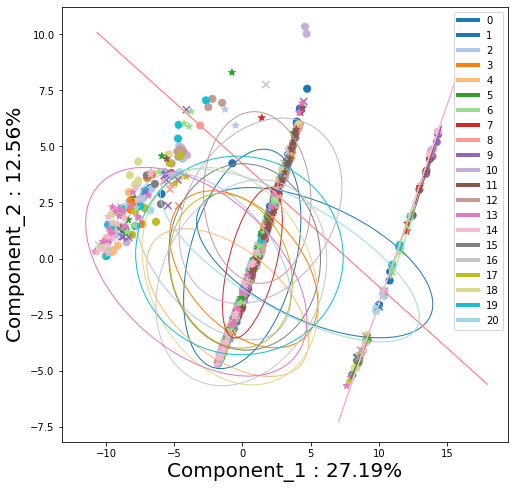

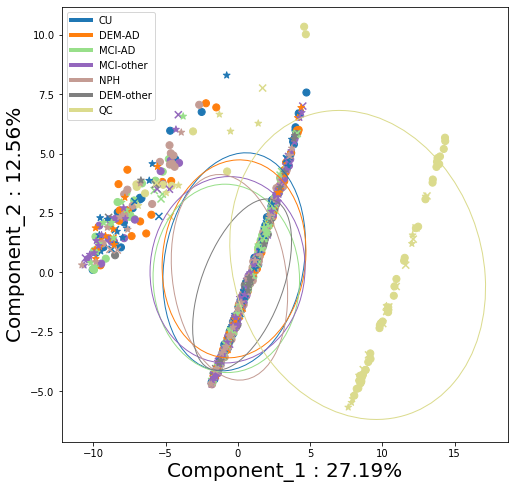

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


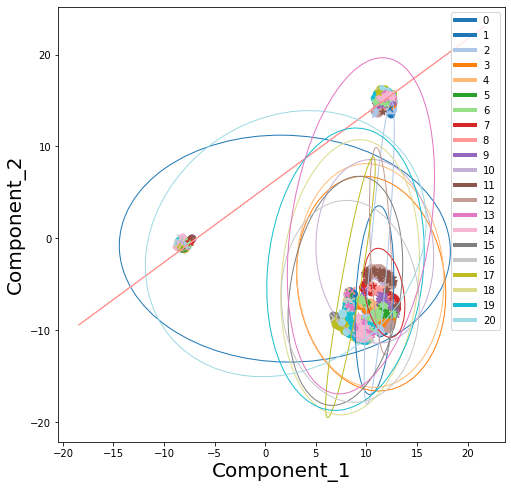

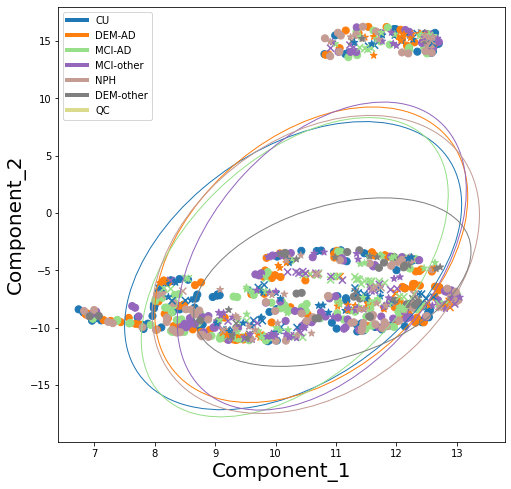

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'minmax', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'minmax')


# Minmax per batch

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('minmax_per_batch', data, device='cpu')

Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ----------  --
CU_DEM-AD            0.0484783    1
CU_MCI-AD            0.0322725    2
CU_MCI-other         0.0916141    0
CU_NPH               0.0298181    5
CU_DEM-other         0.0376114    4
DEM-AD_MCI-AD        0.0206313    1
DEM-AD_MCI-other     0.0659908    0
DEM-AD_NPH           0.00681815   2
DEM-AD_DEM-other     0.0379476    1
MCI-AD_MCI-other     0.111398     0
MCI-AD_NPH           0.00614562  20
MCI-AD_DEM-other     0.00240776   7
MCI-other_NPH        0.027838     5
MCI-other_

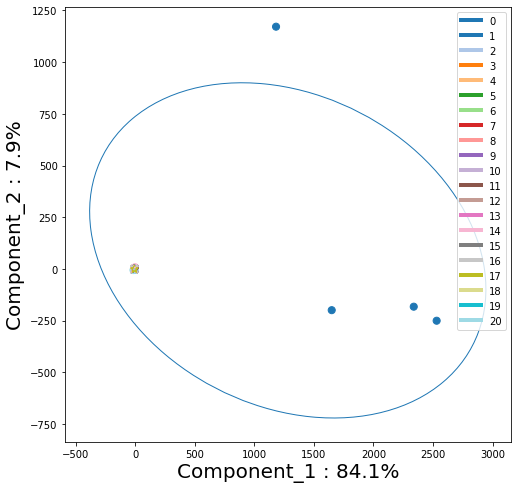

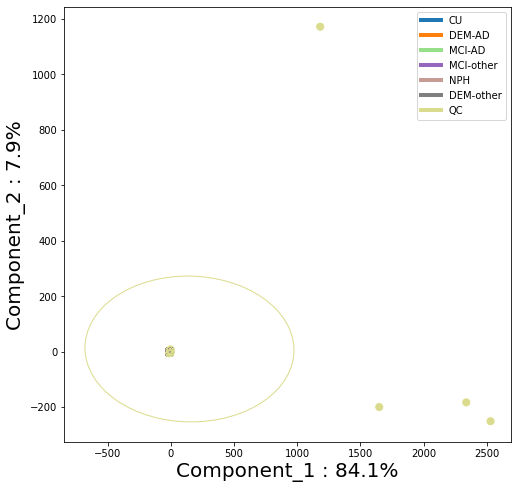

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


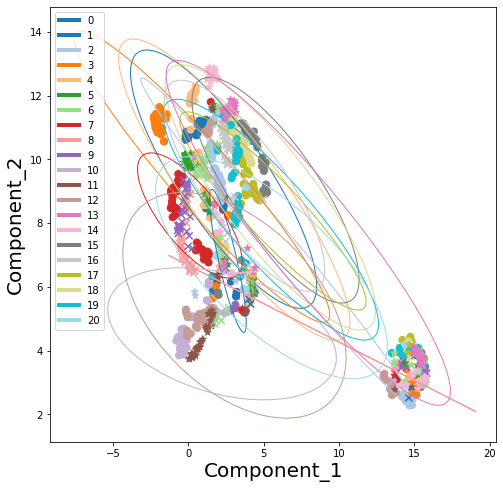

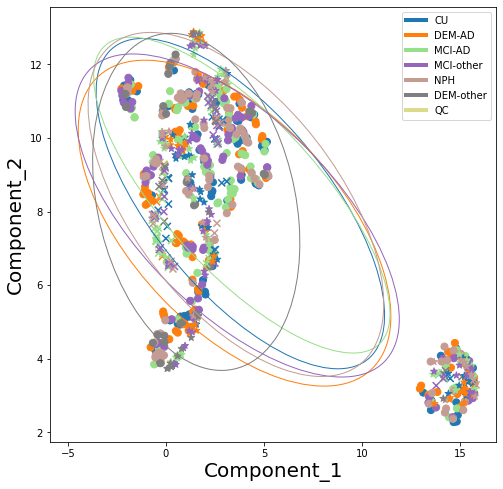

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'minmax_per_batch', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'minmax_per_batch')


# Standard

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  -----------  --
CU_DEM-AD            0.142352      0
CU_MCI-AD            0.00121893   18
CU_MCI-other         0.00945922   48
CU_NPH               0.0928049     0
CU_DEM-other         0.00227267   11
DEM-AD_MCI-AD        0.0280868     1
DEM-AD_MCI-other     0.0302425     1
DEM-AD_NPH           0.121027      0
DEM-AD_DEM-other     0.0020932     3
MCI-AD_MCI-other     0.0752638     0
MCI-AD_NPH           0.0489083     1
MCI-AD_DEM-other     6.23583e-06  20
MCI-other_NPH        0.0654746   

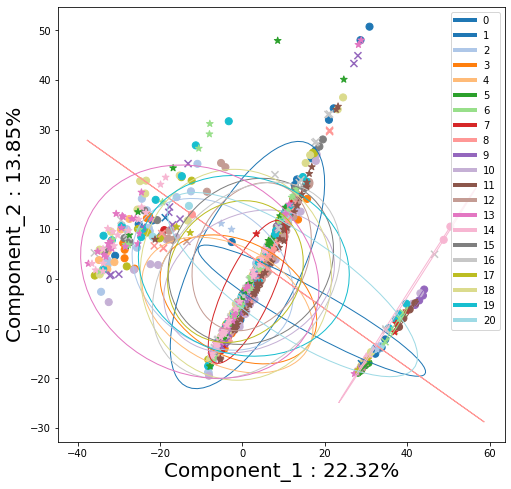

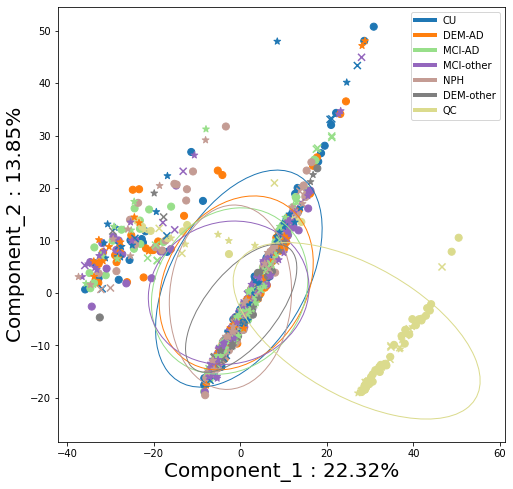

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


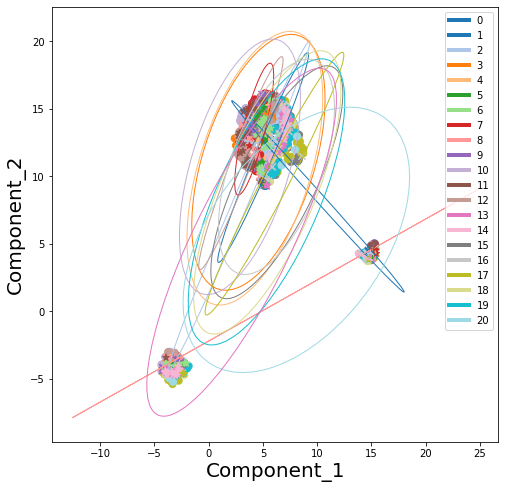

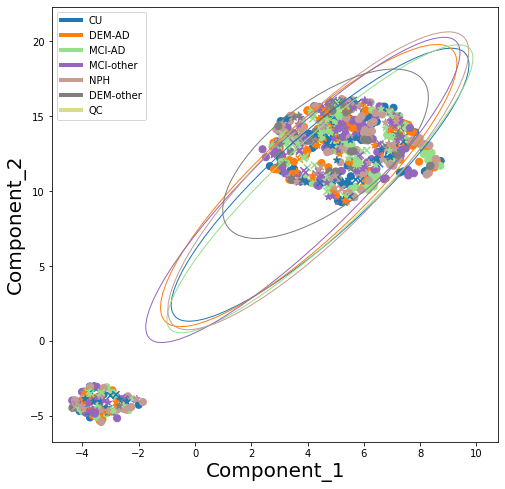

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'standard', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'standard')


# Standard per batch

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard_per_batch', data, device='cpu')

Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ---------  -
CU_DEM-AD            0.721505   0
CU_MCI-AD            0.060172   0
CU_MCI-other         0.118721   0
CU_NPH               0.0944826  0
CU_DEM-other         0.485122   0
DEM-AD_MCI-AD        0.751814   0
DEM-AD_MCI-other     0.128432   0
DEM-AD_NPH           0.392623   0
DEM-AD_DEM-other     0.126889   0
MCI-AD_MCI-other     0.0847524  0
MCI-AD_NPH           0.115539   0
MCI-AD_DEM-other     0.119773   0
MCI-other_NPH        0.0309325  1
MCI-other_DEM-other  0.0279657  2
NPH_

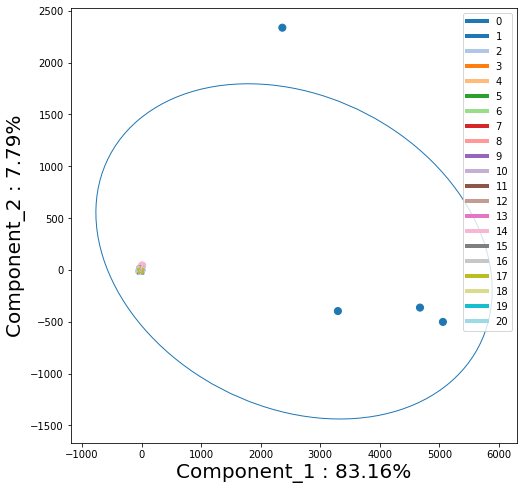

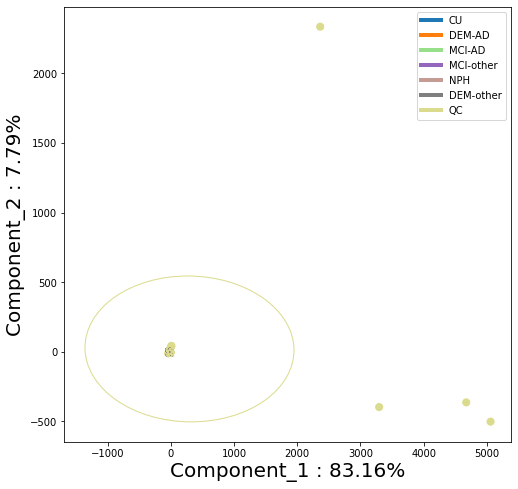

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


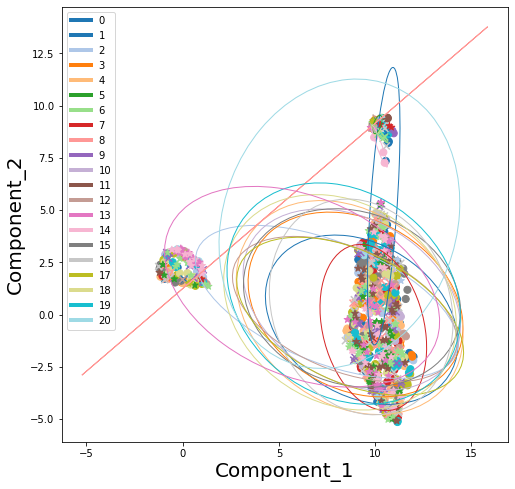

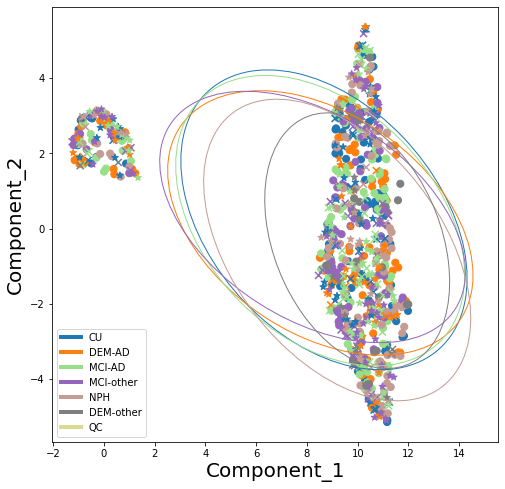

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'standard_per_batch', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'standard_per_batch')


# Robust

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('robust', data, device='cpu')

Mann      pval min    n pvals < 0.05


-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  -----------  --
CU_DEM-AD            0.142352      0
CU_MCI-AD            0.00121893   18
CU_MCI-other         0.00945922   48
CU_NPH               0.0928049     0
CU_DEM-other         0.00227267   11
DEM-AD_MCI-AD        0.0280868     1
DEM-AD_MCI-other     0.0302425     1
DEM-AD_NPH           0.121027      0
DEM-AD_DEM-other     0.0020932     3
MCI-AD_MCI-other     0.0752638     0
MCI-AD_NPH           0.0489083     1
MCI-AD_DEM-other     6.23583e-06  20
MCI-other_NPH        0.0654746     0
MCI-other_DEM-other  0.000193577 

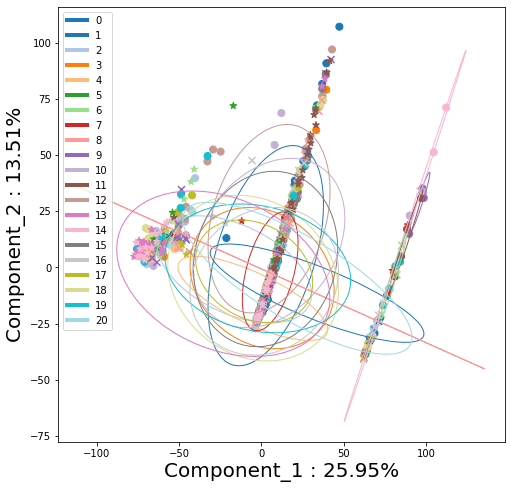

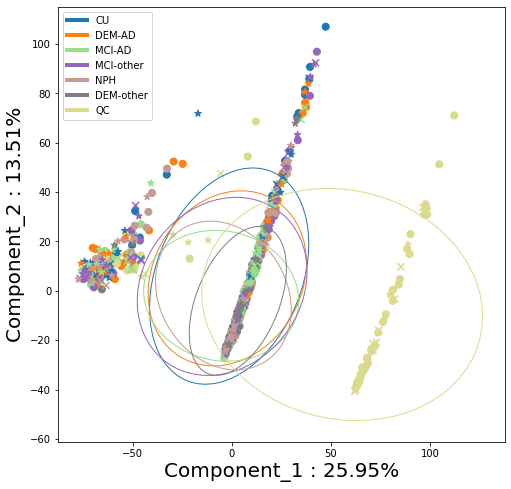

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


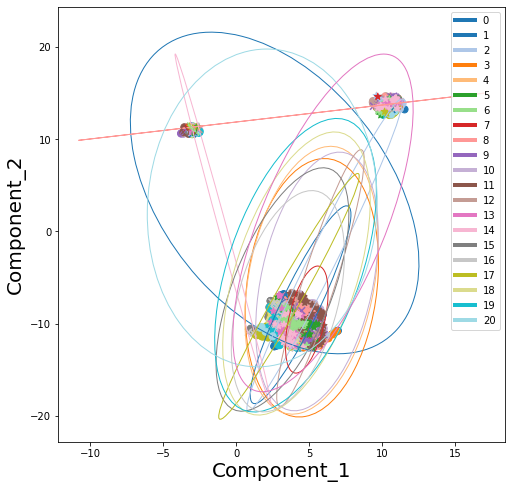

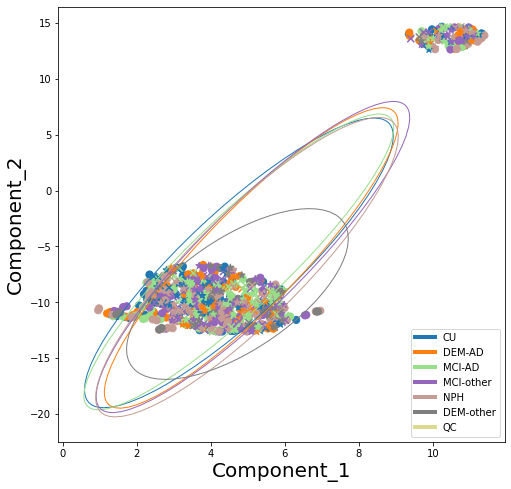

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'robust', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'robust')


# Robust per batch

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('robust_per_batch', data, device='cpu')

Mann      pval min    n pvals < 0.05


-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  -----------  -
CU_DEM-AD            0.286563     0
CU_MCI-AD            0.0907862    0
CU_MCI-other         0.13009      0
CU_NPH               0.207338     0
CU_DEM-other         0.0666022    0
DEM-AD_MCI-AD        0.687826     0
DEM-AD_MCI-other     0.246507     0
DEM-AD_NPH           0.506016     0
DEM-AD_DEM-other     0.000377105  1
MCI-AD_MCI-other     0.0584694    0
MCI-AD_NPH           0.22474      0
MCI-AD_DEM-other     0.0290894    2
MCI-other_NPH        0.121292     0
MCI-other_DEM-other  0.00743598   3
NPH_DEM-oth

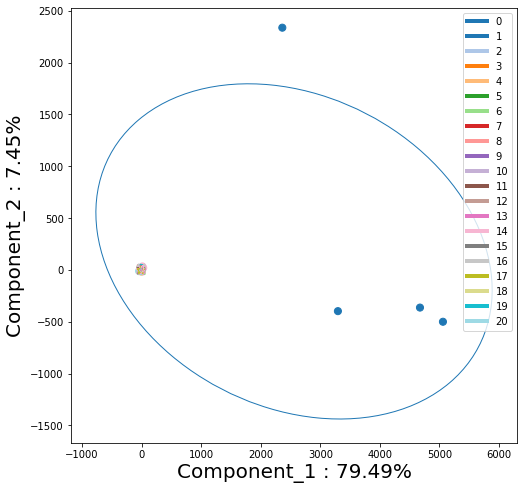

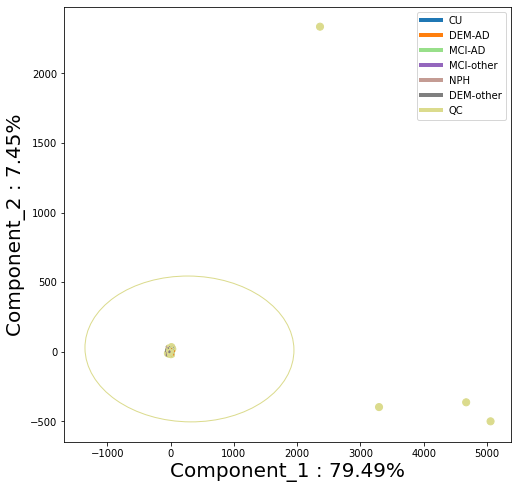

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


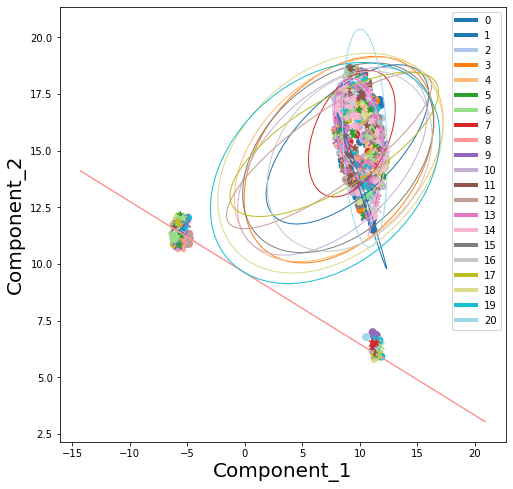

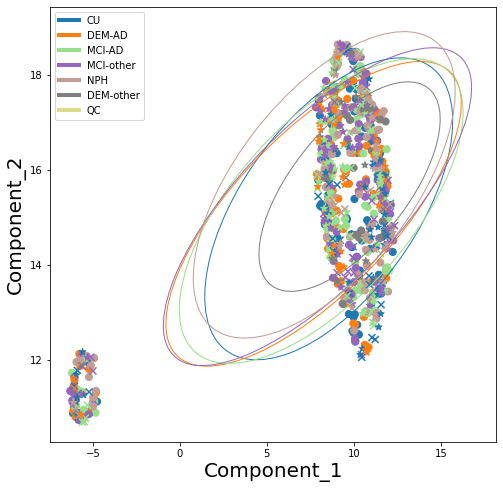

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'robust_per_batch', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'robust_per_batch')


# Combat

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
# unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]


print(data['inputs']['train'].shape)
print(data['inputs']['test'].shape)
print(data['inputs']['valid'].shape)
print(data['inputs']['all'].shape)
data = remove_batch_effect(get_berm('combat'), data)
print(data['inputs']['all'].shape)

# data['inputs']['all'] = data['inputs']['all'].fillna(0)
#data['inputs']['train'][np.isnan(data['inputs']['train'])] = 0
# data['inputs']['train_pool'][np.isnan(data['inputs']['train_pool'])] = 0
# data['inputs']['valid'][np.isnan(data['inputs']['valid'])] = 0
# data['inputs']['valid_pool'][np.isnan(data['inputs']['valid_pool'])] = 0
# data['inputs']['test'][np.isnan(data['inputs']['test'])] = 0
# data['inputs']['test_pool'][np.isnan(data['inputs']['test_pool'])] = 0


(492, 896)
(215, 896)
(132, 896)
(839, 896)
not with classes!


R[write to console]: Found21batches

R[write to console]: Adjusting for0covariate(s) or covariate level(s)

R[write to console]: Standardizing Data across genes

R[write to console]: Fitting L/S model and finding priors

R[write to console]: Finding parametric adjustments

R[write to console]: Adjusting the Data




train 0
valid 492
test 624
train_pool 839
valid_pool 889
test_pool 905
(839, 896)


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  --------  -
CU_DEM-AD            0.531844  0
CU_MCI-AD            0.999316  0
CU_MCI-other         0.673102  0
CU_NPH               0.271628  0
CU_DEM-other         0.999591  0
DEM-AD_MCI-AD        0.801009  0
DEM-AD_MCI-other     0.999117  0
DEM-AD_NPH           0.999449  0
DEM-AD_DEM-other     0.837361  0
MCI-AD_MCI-other     0.933061  0
MCI-AD_NPH           0.500333  0
MCI-AD_DEM-other     0.999686  0
MCI-other_NPH        0.998136  0
MCI-other_DEM-other  0.984862  0
NPH_DEM-other      

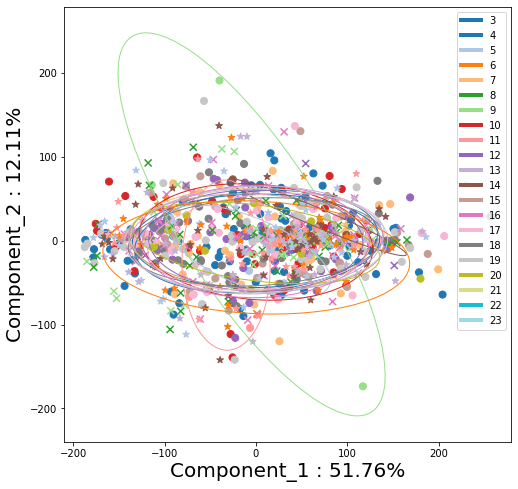

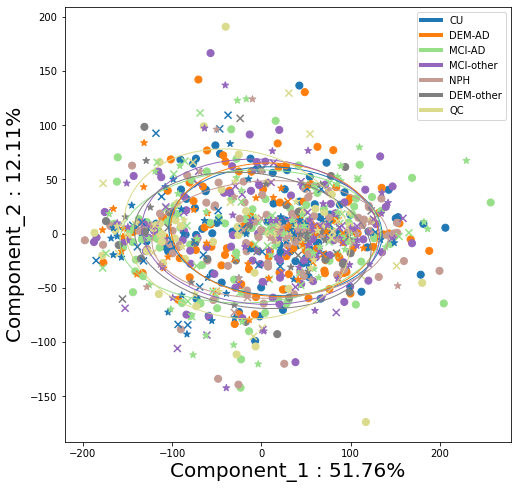

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


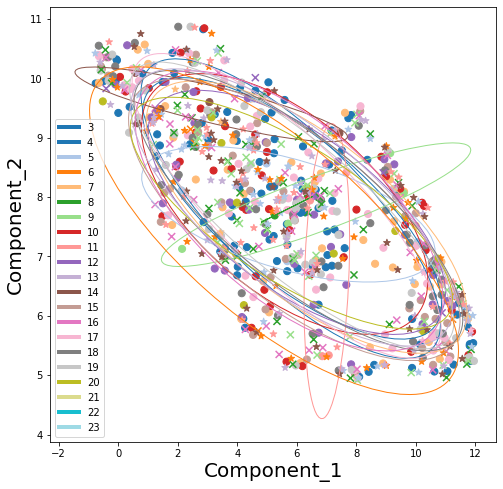

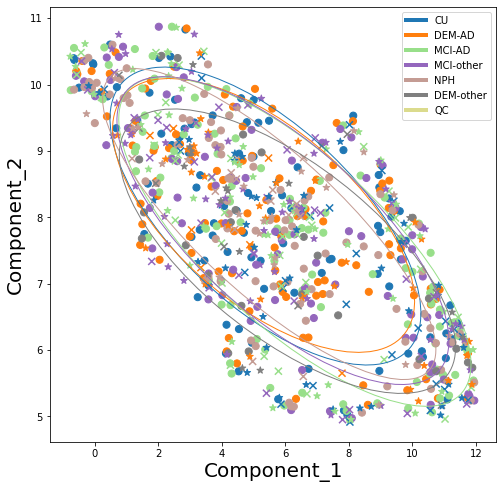

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'combat', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'combat')


# pyCombat

In [ ]:
from combat.pycombat import pycombat
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data = use_pycombat(pycombat, data)


Found 21 batches.
Adjusting for 0 covariate(s) or covariate level(s).
Standardizing Data across genes.
Fitting L/S model and finding priors.
Finding parametric adjustments.
Adjusting the Data


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ----------  -
CU_DEM-AD            0.577102    0
CU_MCI-AD            0.0166629   1
CU_MCI-other         0.0610667   0
CU_NPH               0.123021    0
CU_DEM-other         0.0661162   0
DEM-AD_MCI-AD        0.638112    0
DEM-AD_MCI-other     0.0786622   0
DEM-AD_NPH           0.304394    0
DEM-AD_DEM-other     0.00444247  1
MCI-AD_MCI-other     0.154854    0
MCI-AD_NPH           0.050448    0
MCI-AD_DEM-other     0.0286799   1
MCI-other_NPH        0.0181656   1
MCI-other_DEM-other  0.0

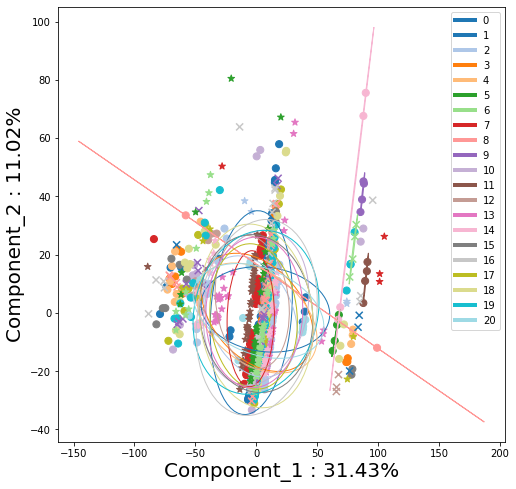

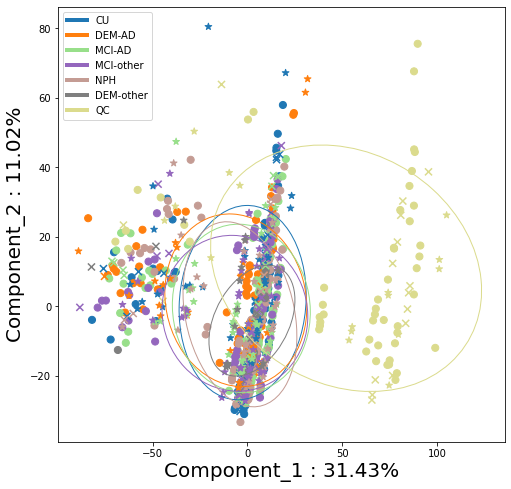

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


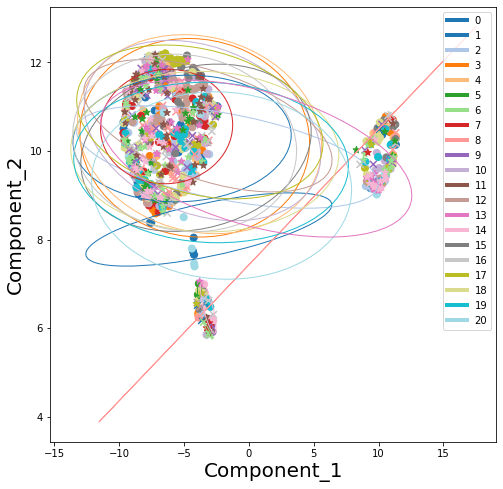

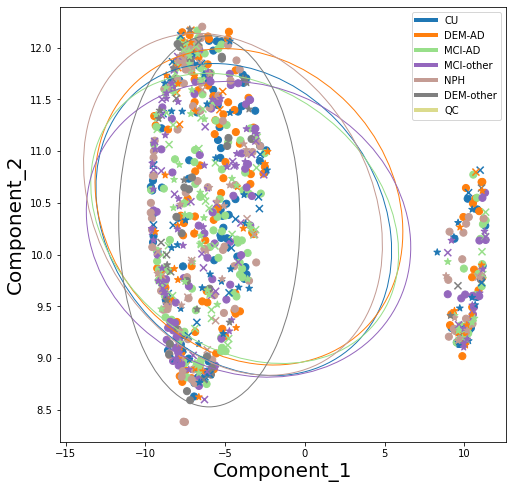

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'pycombat', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'pycombat')


# Harmony

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data['inputs']['all'].iloc[:] = minmax_scaler.fit_transform(data['inputs']['all'])
data['inputs']['all_pool'].iloc[:] = minmax_scaler.transform(data['inputs']['all_pool'])
data['inputs']['train'].iloc[:] = minmax_scaler.transform(data['inputs']['train'])
data['inputs']['train_pool'].iloc[:] = minmax_scaler.transform(data['inputs']['train_pool'])
data['inputs']['valid'].iloc[:] = minmax_scaler.transform(data['inputs']['valid'])
data['inputs']['valid_pool'].iloc[:] = minmax_scaler.transform(data['inputs']['valid_pool'])
data['inputs']['test'].iloc[:] = minmax_scaler.transform(data['inputs']['test'])
data['inputs']['test_pool'].iloc[:] = minmax_scaler.transform(data['inputs']['test_pool'])
data = remove_batch_effect(get_berm('harmony'), data)



R[write to console]: Transposing data matrix

R[write to console]: Hard k-means centroids initialization
R[write to console]: 

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]

train 0
valid 492
test 624
train_pool 839
valid_pool 889
test_pool 905


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ---------  -
CU_DEM-AD            0.276105   0
CU_MCI-AD            0.869688   0
CU_MCI-other         0.0287989  1
CU_NPH               0.328282   0
CU_DEM-other         0.72098    0
DEM-AD_MCI-AD        0.0130625  3
DEM-AD_MCI-other     0.468373   0
DEM-AD_NPH           0.378617   0
DEM-AD_DEM-other     0.38779    0
MCI-AD_MCI-other     0.406542   0
MCI-AD_NPH           0.432171   0
MCI-AD_DEM-other     0.929444   0
MCI-other_NPH        0.0366496  1
MCI-other_DEM-other  0.492803   0
NPH_

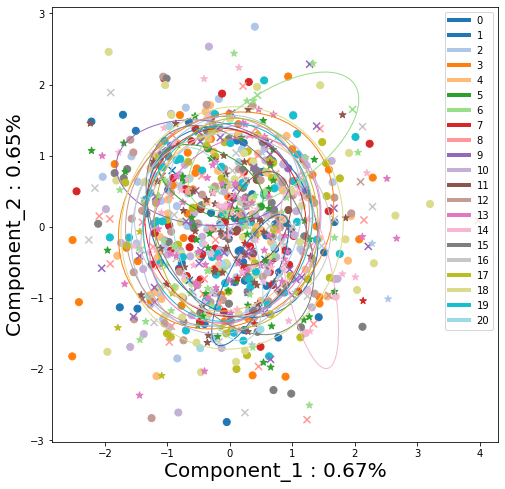

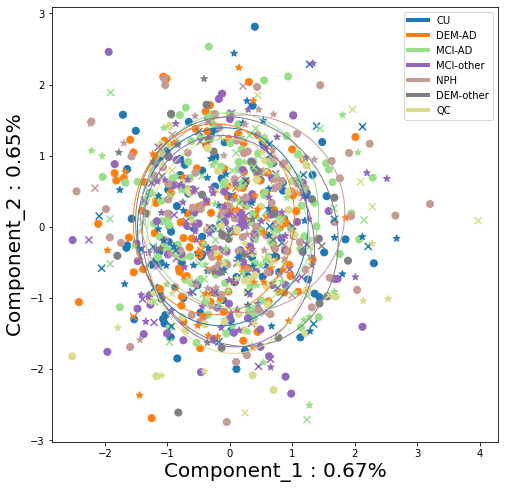

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


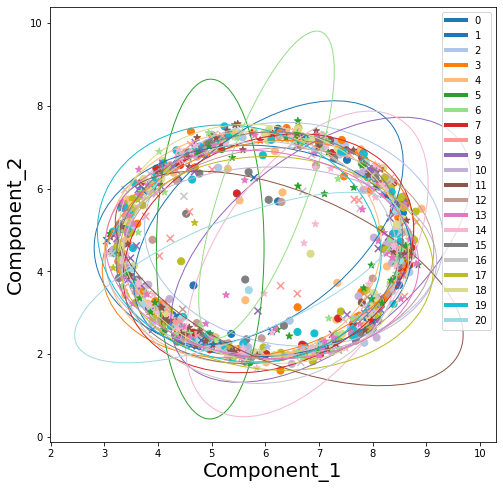

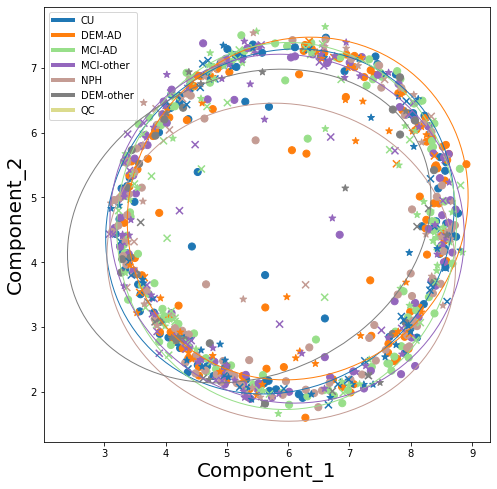

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'harmony', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'harmony')


# WaveICA

In [ ]:
import pandas as pd
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter

def waveicaR(data, batches):
    with localconverter(robjects.default_converter + pandas2ri.converter):
        data_r = robjects.conversion.py2rpy(data)

    # data_r = robjects.r.matrix(robjects.FloatVector(df.values.reshape(-1)), nrow=df.shape[0])
    batches_r = robjects.IntVector(batches.reshape(-1))
    waveica = importr('WaveICA')
    # data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    newdata = waveica.WaveICA(dat=data_r, batch=batches_r)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        newdata = { key : np.array(robjects.conversion.rpy2py(newdata.rx2(key))) for key in newdata.names }
    return newdata['data_wave']


path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)
data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

df = data['inputs']['all']
all_batches = data['batches']['all']
# assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
# tmp = waveicaR(df, all_batches)
data = remove_batch_effect(waveicaR, data)


R[write to console]: 
waveslim: Wavelet Method for 1/2/3D Signals (version = 1.8.4)




######Decomposition 1 ########
######Decomposition 2 ########
######Decomposition 3 ########
######Decomposition 4 ########
######Decomposition 5 ########
######Decomposition 6 ########
######Decomposition 7 ########
######Decomposition 8 ########
######Decomposition 9 ########
######Decomposition 10 ########
######Decomposition 11 ########
######Decomposition 12 ########
######Decomposition 13 ########
######Decomposition 14 ########
######Decomposition 15 ########
######Decomposition 16 ########
######Decomposition 17 ########
######Decomposition 18 ########
######Decomposition 19 ########
######Decomposition 20 ########
######Decomposition 21 ########
######Decomposition 22 ########
######Decomposition 23 ########
######Decomposition 24 ########
######Decomposition 25 ########
######Decomposition 26 ########
######Decomposition 27 ########
######Decomposition 28 ########
######Decomposition 29 ########
######Decomposition 30 ########
######Decomposition 31 ########
######Decompositi

Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  -----------  -
CU_DEM-AD            0.833738     0
CU_MCI-AD            0.275961     0
CU_MCI-other         0.397466     0
CU_NPH               0.220455     0
CU_DEM-other         0.00095742   3
DEM-AD_MCI-AD        0.307756     0
DEM-AD_MCI-other     0.0252634    1
DEM-AD_NPH           0.194607     0
DEM-AD_DEM-other     1.97433e-05  2
MCI-AD_MCI-other     0.203046     0
MCI-AD_NPH           0.574157     0
MCI-AD_DEM-other     0.00133437   1
MCI-other_NPH        0.0417697    2
MCI-other_

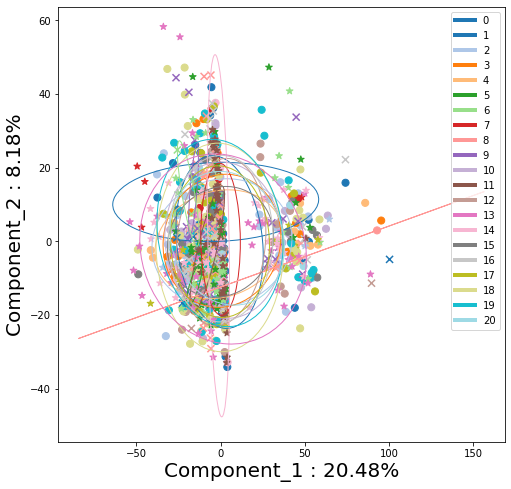

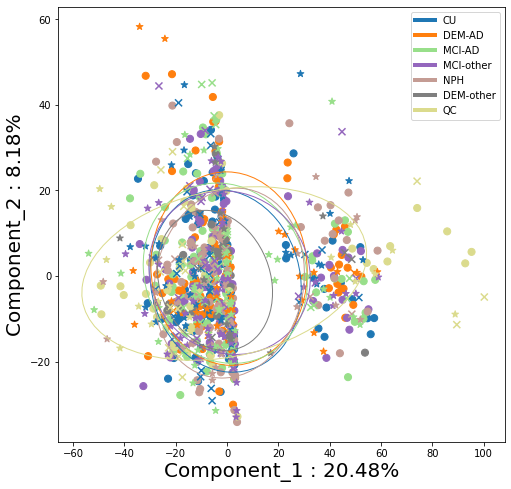

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


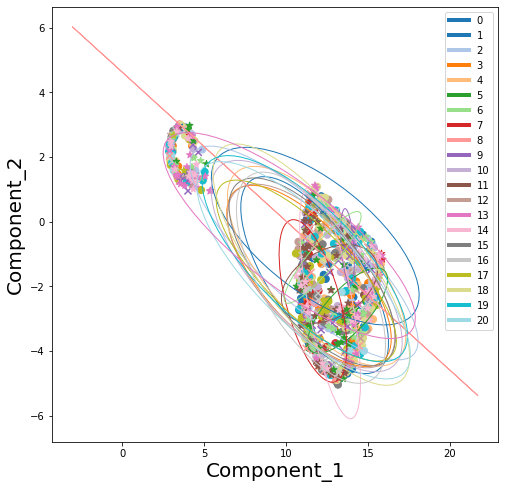

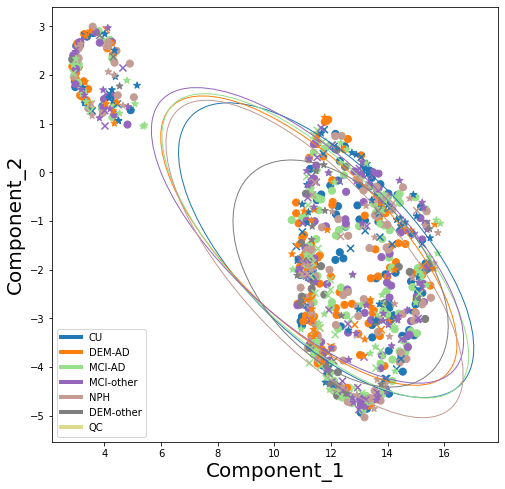

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'harmony', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
train_fct(copy.deepcopy(data), n_meta, train_models, 'harmony')


In [ ]:
if log_stuff:
    # table = pd.DataFrame(columns=list(metrics['raw']['all'].keys()) + ['delta', 'delta_pool'], index=list(metrics.keys()))
    cols = ['qc_aPCC', '[qc_dist/tot_eucl]', 'lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    cols_pool = ['pool lisi', 'pool silhouette', 'pool kbet', 'pool shannon', 'pool adjusted_rand_score', 'pool adjusted_mutual_info_score',]
    table = pd.DataFrame(columns=cols + cols_pool, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['valid'][col]

table

,qc_aPCC,[qc_dist/tot_eucl],lisi,silhouette,kbet,shannon,adjusted_rand_score,adjusted_mutual_info_score,pool lisi,pool silhouette,pool kbet,pool shannon,pool adjusted_rand_score,pool adjusted_mutual_info_score
raw,0.732741,1.633227,2.563367,-0.045069,0.0,1.873298,0.32577,0.530779,NaN,NaN,NaN,NaN,NaN,NaN
minmax,0.612985,1.655757,4.659393,-0.041588,0.0,1.856461,0.315945,0.520489,NaN,NaN,NaN,NaN,NaN,NaN
minmax_per_batch,0.339852,2.736291,3.498748,0.010096,0.0,1.816375,0.576815,0.723766,NaN,NaN,NaN,NaN,NaN,NaN
standard,0.344475,1.437067,3.795473,-0.070957,0.0,2.000445,0.215521,0.433142,NaN,NaN,NaN,NaN,NaN,NaN
standard_per_batch,0.213869,2.806813,2.557035,-0.057288,0.0,2.307424,0.014325,0.049482,NaN,NaN,NaN,NaN,NaN,NaN
robust,0.254128,1.739949,4.437793,-0.126714,0.00244,2.068903,0.10845,0.315013,NaN,NaN,NaN,NaN,NaN,NaN
robust_per_batch,0.186732,2.247473,4.292547,-0.248365,0.000096,2.328464,0.03113,0.1465,NaN,NaN,NaN,NaN,NaN,NaN
combat,-0.020775,1.110385,1.225609,-0.262312,0.0,2.525115,0.00138,0.006405,NaN,NaN,NaN,NaN,NaN,NaN
pycombat,0.743668,1.855771,2.32185,-0.076422,0.0,2.163173,0.02424,0.126999,NaN,NaN,NaN,NaN,NaN,NaN
harmony,0.751352,1.676539,3.167542,-0.080314,0.0,2.245676,0.00838,0.033595,NaN,NaN,NaN,NaN,NaN,NaN


# AE 

In [ ]:
from src.dl.models.pytorch.aedann import AutoEncoder2 as AutoEncoder


## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('robust', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/no_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=1593,
                     mapper=0,
                     layer2=283,
                     dropout=0,
                     n_meta=0,
                     n_emb=2,
                     n_layers=2,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False, mapping=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False, mapping=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False, mapping=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False, mapping=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ----------  --
CU_DEM-AD            0.84778      0
CU_MCI-AD            0.0484423   14
CU_MCI-other         0.108857     0
CU_NPH               0.260655     0
CU_DEM-other         0.112393     0
DEM-AD_MCI-AD        0.197473     0
DEM-AD_MCI-other     0.922676     0
DEM-AD_NPH           0.293338     0
DEM-AD_DEM-other     0.255257     0
MCI-AD_MCI-other     0.579132     0
MCI-AD_NPH           0.112165     0
MCI-AD_DEM-other     0.0203688    3
MCI-other_NPH        0.00971948   1
MCI-other_

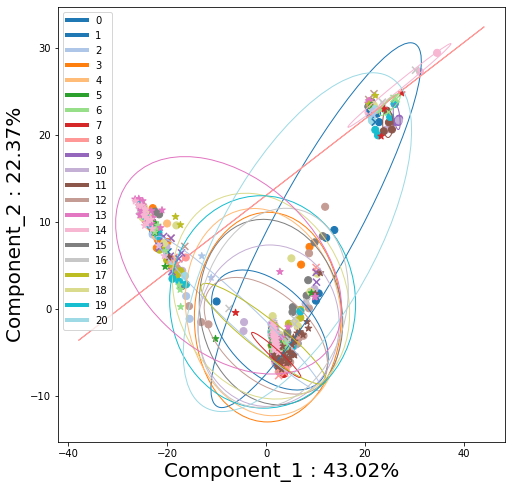

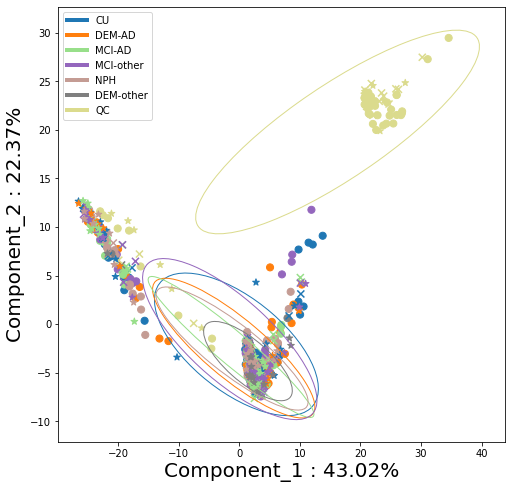

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


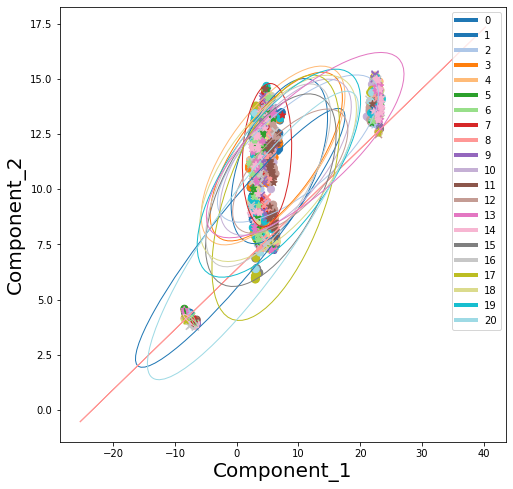

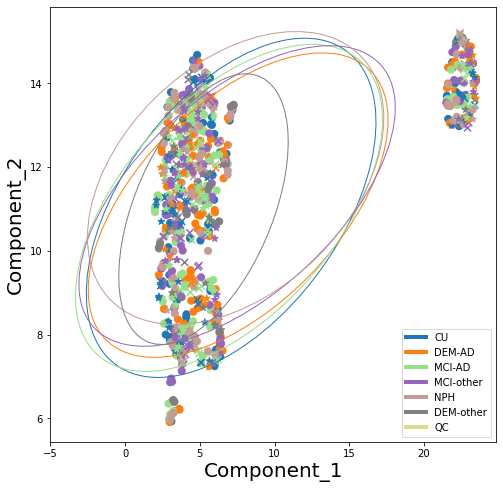

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'ae', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'harmony')


# NORMAE 

In [ ]:
from src.dl.models.pytorch.aedann import AutoEncoder2 as AutoEncoder


## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/normae_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=745,
                     mapper=0,
                     layer2=474,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=True)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=True)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=True)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  -----------  ---
CU_DEM-AD            0.00543358     3
CU_MCI-AD            0.0108996      3
CU_MCI-other         0.115148       0
CU_NPH               0.200437       0
CU_DEM-other         3.85522e-05  136
DEM-AD_MCI-AD        0.262193       0
DEM-AD_MCI-other     0.119862       0
DEM-AD_NPH           0.00307306    12
DEM-AD_DEM-other     0.024633      15
MCI-AD_MCI-other     0.0969727      0
MCI-AD_NPH           0.0329343      1
MCI-AD_DEM-other     0.00127922    85
MCI-other_NPH       

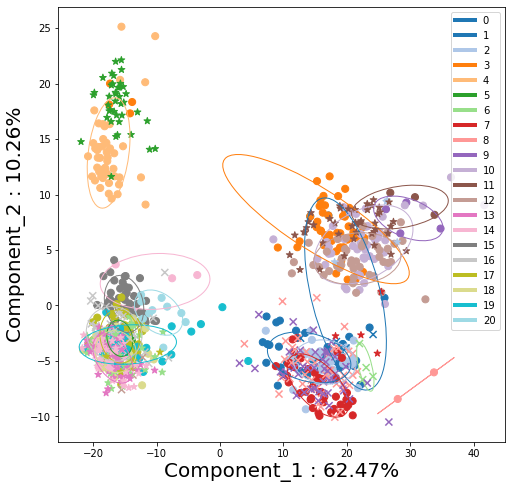

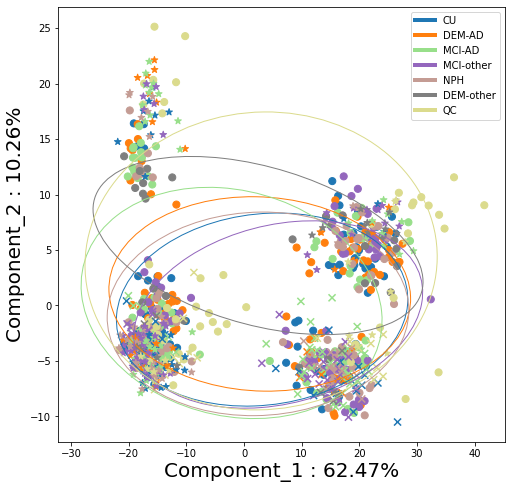

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


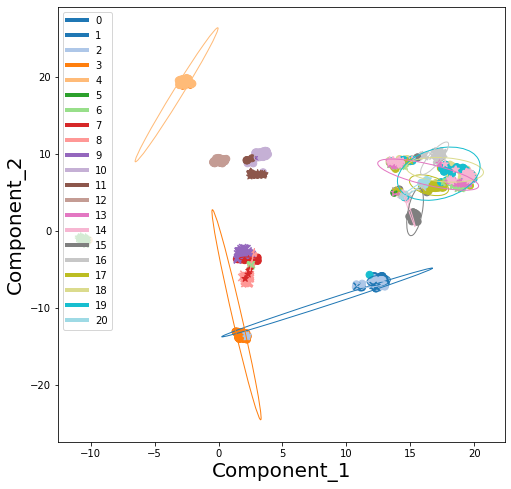

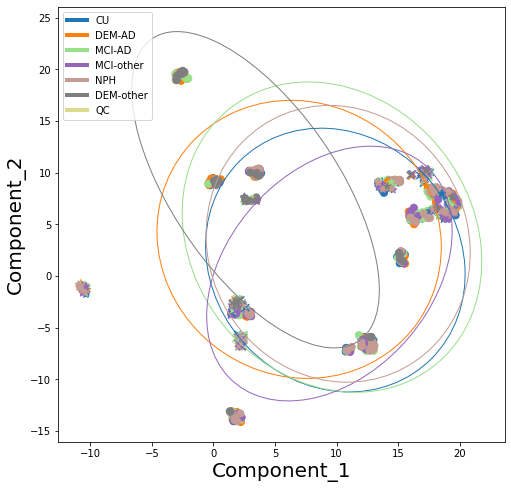

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'normae', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# AEDANN

## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('robust', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/DANN_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=745,
                     mapper=0,
                     layer2=474,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=True, mapping=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ----------  -
CU_DEM-AD            0.0626856   0
CU_MCI-AD            0.137867    0
CU_MCI-other         0.380888    0
CU_NPH               0.0261092   1
CU_DEM-other         0.0592862   0
DEM-AD_MCI-AD        0.135905    0
DEM-AD_MCI-other     0.439852    0
DEM-AD_NPH           0.0851388   0
DEM-AD_DEM-other     0.0692358   0
MCI-AD_MCI-other     0.285803    0
MCI-AD_NPH           0.15273     0
MCI-AD_DEM-other     0.213512    0
MCI-other_NPH        0.0679023   0
MCI-other_DEM-other  0.2

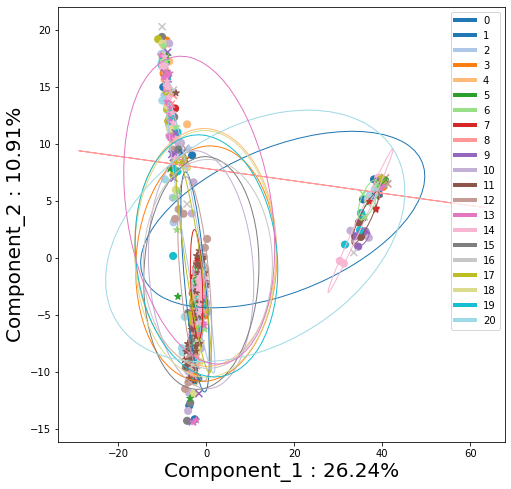

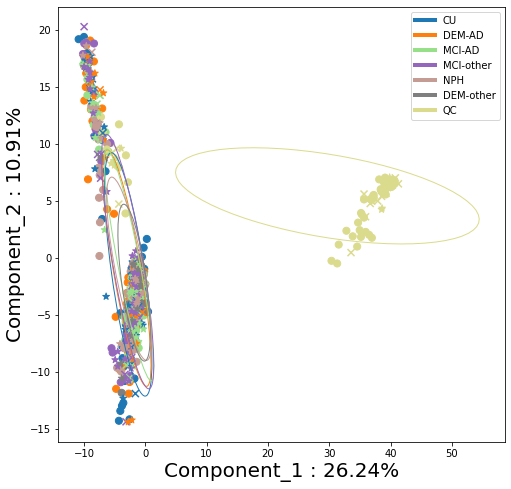

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


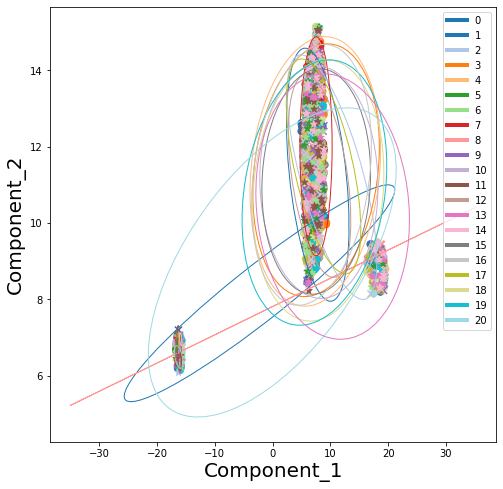

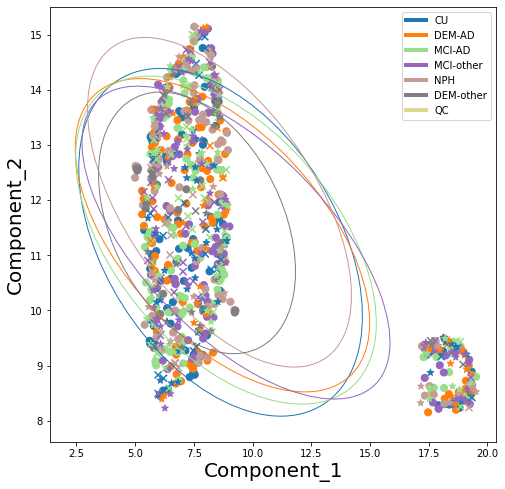

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'aedann', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# AE-invTriplet

## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/inverseTriplet_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=676,
                     mapper=0,
                     layer2=745,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=True)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=True)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=True)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=True)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=True)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=True)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=True)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  -----------  --
CU_DEM-AD            0.0388641    12
CU_MCI-AD            0.0267187     6
CU_MCI-other         0.0622362     0
CU_NPH               0.00324565   22
CU_DEM-other         0.013731     12
DEM-AD_MCI-AD        0.18139       0
DEM-AD_MCI-other     0.0185645     3
DEM-AD_NPH           0.034441     17
DEM-AD_DEM-other     0.00515296   11
MCI-AD_MCI-other     0.0103142     1
MCI-AD_NPH           0.0166239     6
MCI-AD_DEM-other     0.00023342    8
MCI-other_NPH        0.000439049 

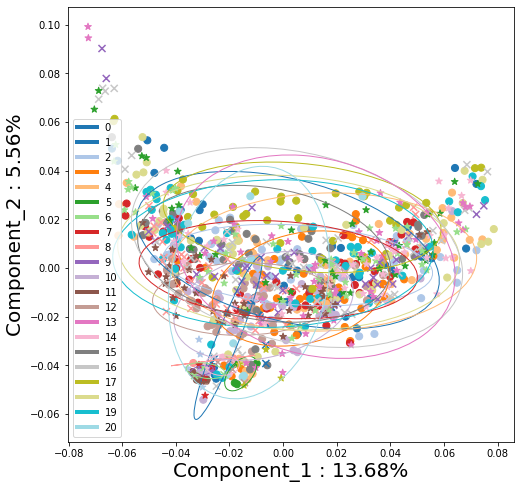

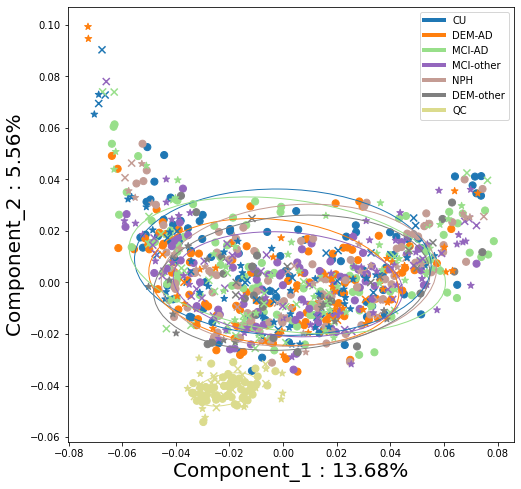

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


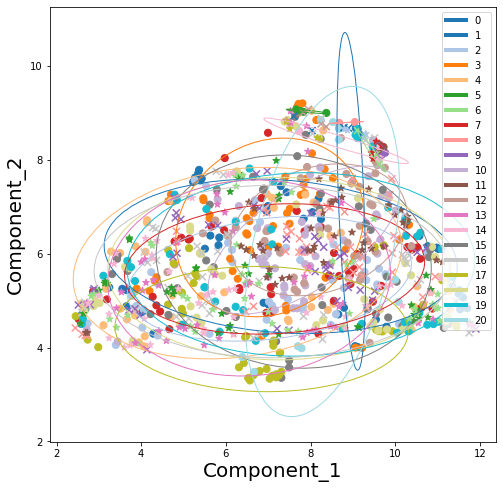

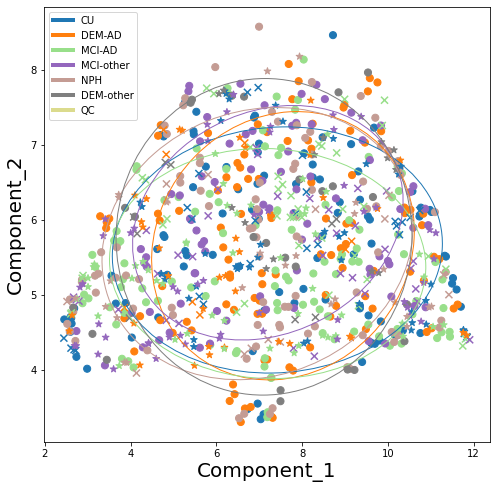

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'ae-invTriplet', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# AE-revTriplet

## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/revTriplet_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=1137,
                     mapper=0,
                     layer2=260,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=True)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=True)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=True)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ---------  ---
CU_DEM-AD            0.35386      0
CU_MCI-AD            0.563395     0
CU_MCI-other         0.857659     0
CU_NPH               0.981653     0
CU_DEM-other         0.150451     0
DEM-AD_MCI-AD        0.112905     0
DEM-AD_MCI-other     0.465724     0
DEM-AD_NPH           0.352574     0
DEM-AD_DEM-other     0.0411894  260
MCI-AD_MCI-other     0.419771     0
MCI-AD_NPH           0.611386     0
MCI-AD_DEM-other     0.261636     0
MCI-other_NPH        0.827005     0
MCI-other_

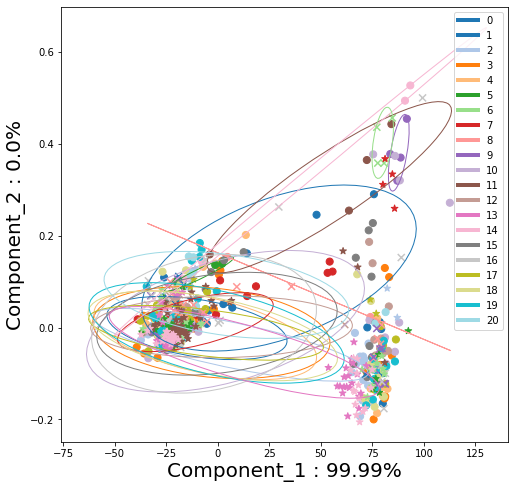

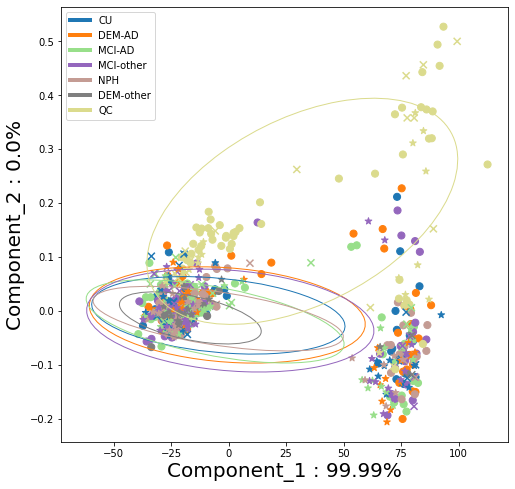

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


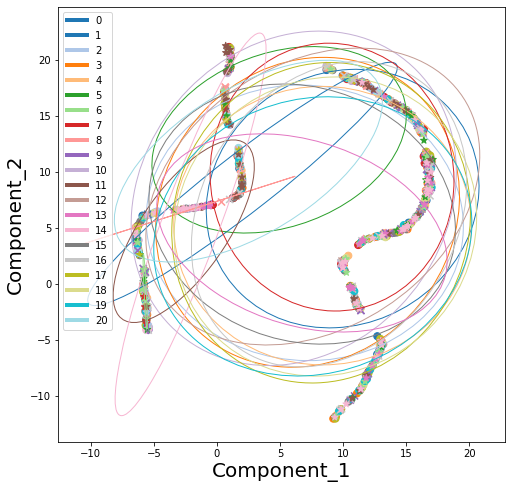

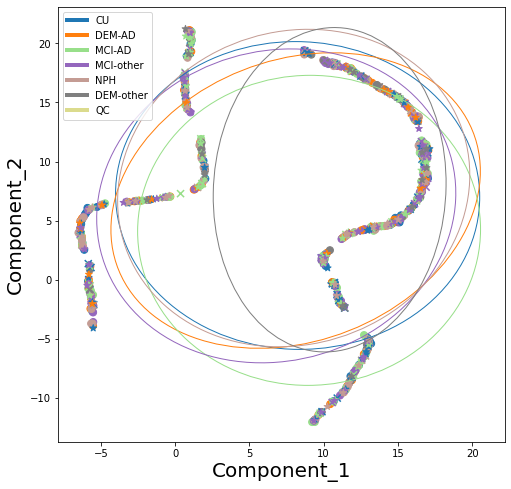

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'ae-revTriplet', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# NORMVAE

## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/normae_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=1427,
                     mapper=0,
                     layer2=353,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ---------  ---
CU_DEM-AD            0.383044     0
CU_MCI-AD            0.560364     0
CU_MCI-other         0.546798     0
CU_NPH               0.587035     0
CU_DEM-other         0.128671     0
DEM-AD_MCI-AD        0.941424     0
DEM-AD_MCI-other     0.997631     0
DEM-AD_NPH           0.998473     0
DEM-AD_DEM-other     0.0449741  239
MCI-AD_MCI-other     0.999108     0
MCI-AD_NPH           0.998798     0
MCI-AD_DEM-other     0.068022     0
MCI-other_NPH        0.999694     0
MCI-other_

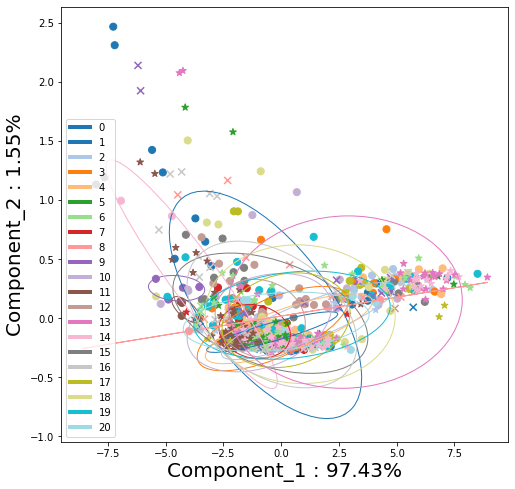

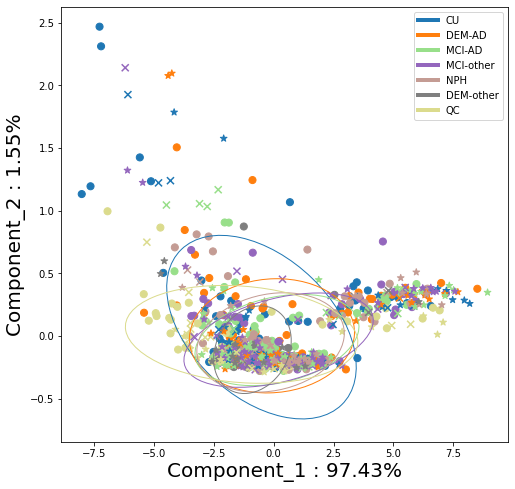

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


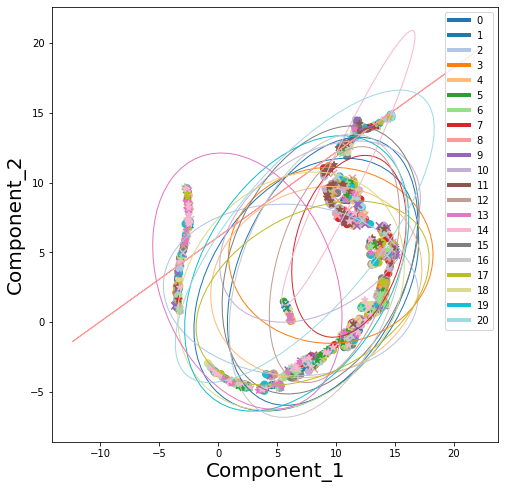

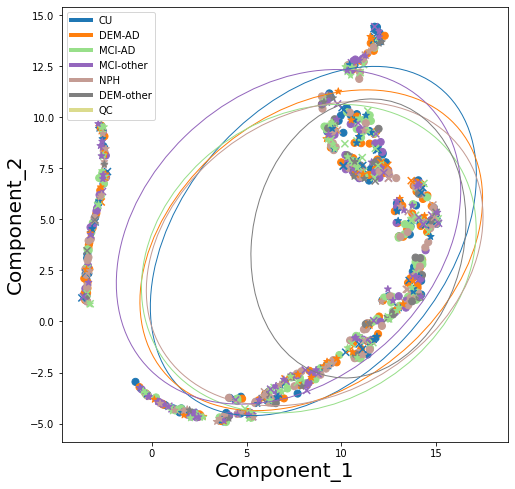

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'normvae', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# VAE

## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/no_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=1137,
                     mapper=0,
                     layer2=260,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ---------  -
CU_DEM-AD            0.608205   0
CU_MCI-AD            0.151163   0
CU_MCI-other         0.287936   0
CU_NPH               0.0995096  0
CU_DEM-other         0.161288   0
DEM-AD_MCI-AD        0.940873   0
DEM-AD_MCI-other     0.999648   0
DEM-AD_NPH           0.724913   0
DEM-AD_DEM-other     0.332849   0
MCI-AD_MCI-other     0.999904   0
MCI-AD_NPH           0.99282    0
MCI-AD_DEM-other     0.8519     0
MCI-other_NPH        0.983377   0
MCI-other_DEM-other  0.789805   0
NPH_

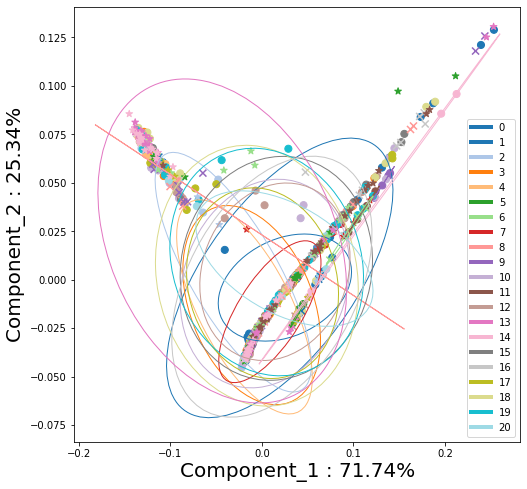

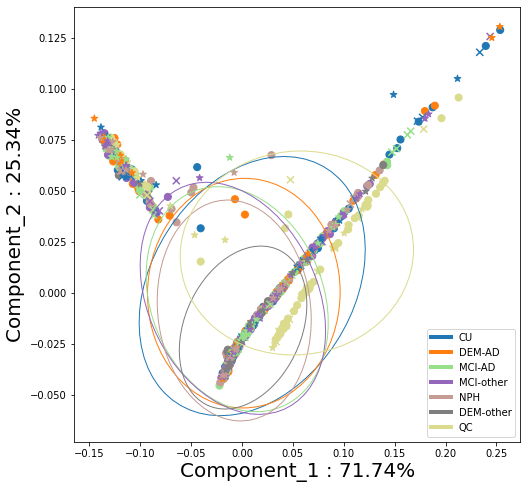

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


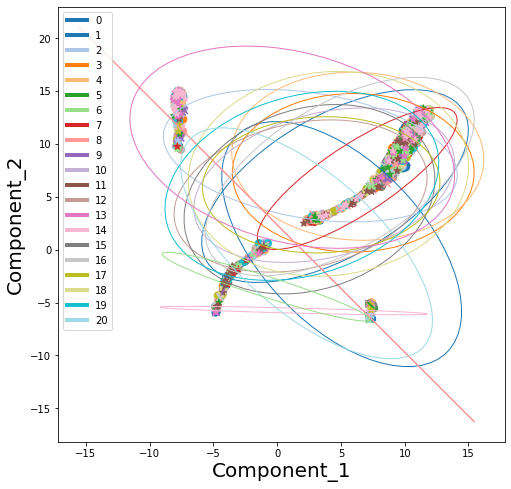

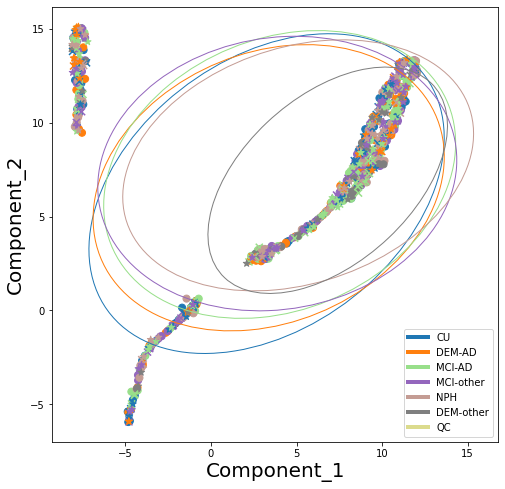

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'vae', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# VAEDANN

## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/DANN_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=1427,
                     mapper=0,
                     layer2=353,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  ---------  -
CU_DEM-AD            0.627947   0
CU_MCI-AD            0.0744172  0
CU_MCI-other         0.488171   0
CU_NPH               0.144463   0
CU_DEM-other         0.225038   0
DEM-AD_MCI-AD        0.747737   0
DEM-AD_MCI-other     0.991429   0
DEM-AD_NPH           0.900388   0
DEM-AD_DEM-other     0.297493   0
MCI-AD_MCI-other     0.990147   0
MCI-AD_NPH           0.999915   0
MCI-AD_DEM-other     0.568006   0
MCI-other_NPH        0.999608   0
MCI-other_DEM-other  0.605637   0
NPH_

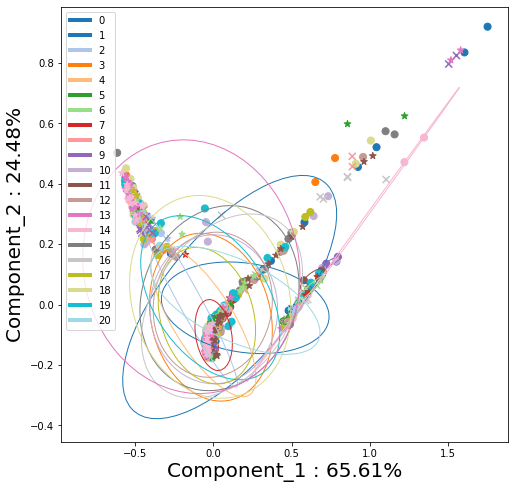

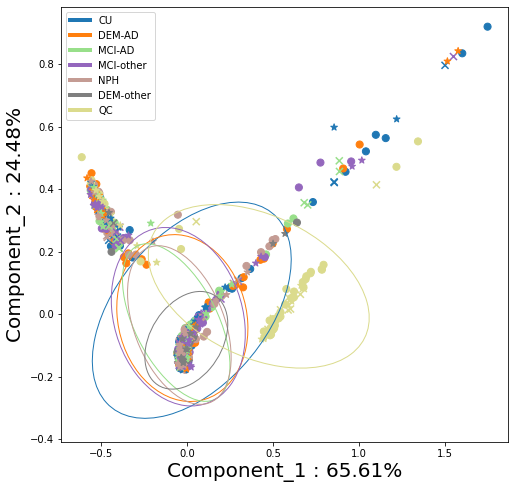

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


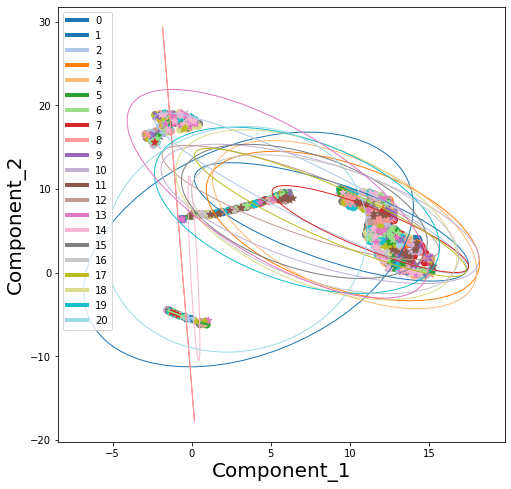

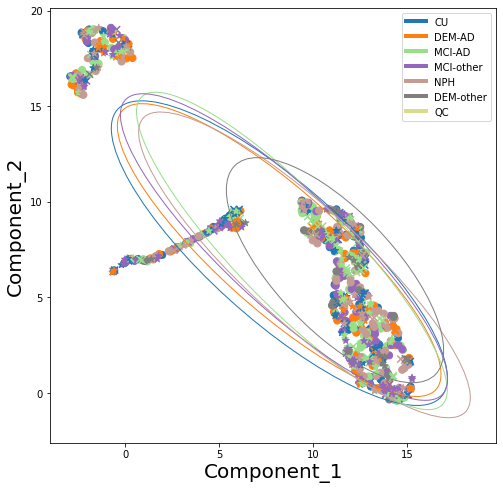

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'vaedann', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# VAE-invTriplet

## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/inverseTriplet_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=1427,
                     mapper=0,
                     layer2=353,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  --------  -
CU_DEM-AD            0.816908  0
CU_MCI-AD            0.117521  0
CU_MCI-other         0.634795  0
CU_NPH               0.193815  0
CU_DEM-other         0.142274  0
DEM-AD_MCI-AD        0.645717  0
DEM-AD_MCI-other     0.980692  0
DEM-AD_NPH           0.957585  0
DEM-AD_DEM-other     0.21409   0
MCI-AD_MCI-other     0.992748  0
MCI-AD_NPH           0.999046  0
MCI-AD_DEM-other     0.525675  0
MCI-other_NPH        0.998794  0
MCI-other_DEM-other  0.413124  0
NPH_DEM-other      

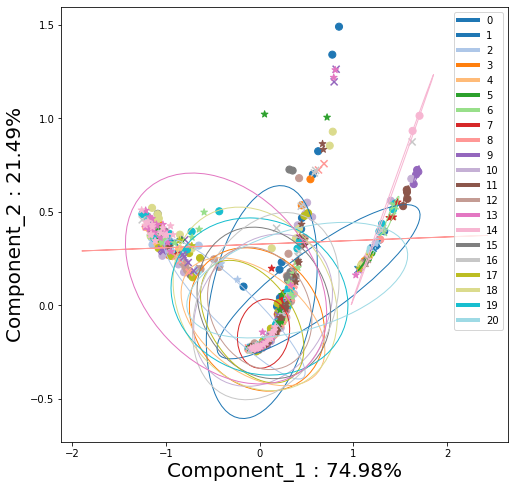

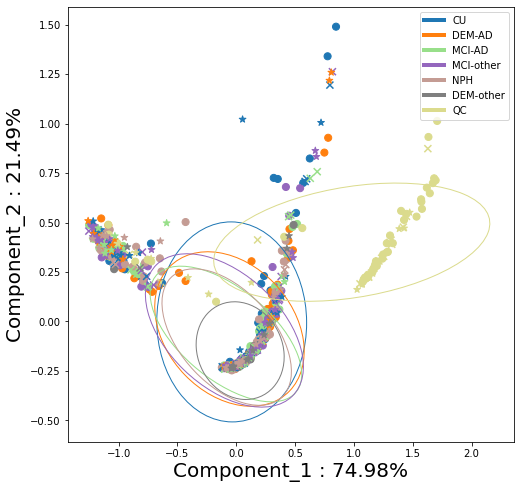

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


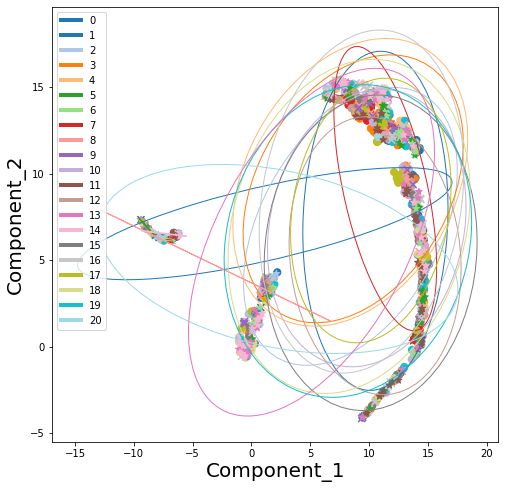

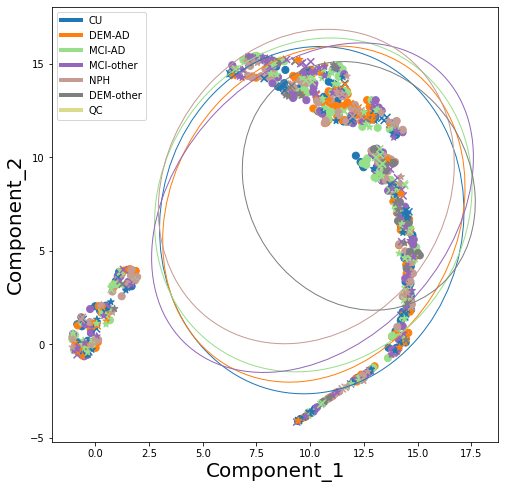

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'vae-invTriplet', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# VAE-revTriplet

## Encoded

In [ ]:
path = 'data'
data, unique_labels, unique_batches = get_amide(path, args)
# unique_labels = get_unique_labels(data['labels']['all'])
unique_batches = np.unique(data['batches']['all'])
unique_cats = np.unique(data['cats']['all'])
unique_ages = np.array(['50s', '60s', '70s', '80+'])
unique_genders = np.unique(data['meta']['all'].iloc[:, 1])
n_cats = len(unique_labels)
n_batches = len(unique_batches)
n_ages = len(unique_ages)
n_genders = len(unique_genders)

data['age'] = {}
data['gender'] = {}
meta_age = []
for age in data['meta']['all'].iloc[:, 0]:
    if age < 50:
        meta_age += ['pool']
    elif age < 60:
        meta_age += ['50s']
    elif age < 70:
        meta_age += ['60s']
    elif age < 80:
        meta_age += ['70s']
    else:
        meta_age += ['80+']
data['age']['all'] = np.array(meta_age)
data['gender']['all'] = data['meta']['all'].iloc[:, 1]

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models/ae_then_classifier_holdout/amide/revTriplet_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=22,
                     nb_classes=2,
                     layer1=1427,
                     mapper=0,
                     layer2=353,
                     dropout=0,
                           n_meta=0,
                           n_emb=2,
                           n_layers=2,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=21,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=False)
enc_data['inputs']['all_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all_pool'].values), batches, sampling=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=False)
enc_data['inputs']['train_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train_pool'].values), batches, sampling=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=False)
enc_data['inputs']['valid_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid_pool'].values), batches, sampling=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=False)
enc_data['inputs']['test_pool'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test_pool'].values), batches, sampling=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


Mann      pval min    n pvals < 0.05
-------------------  -  -
CU_DEM-AD            0  1
CU_MCI-AD            0  1
CU_MCI-other         0  1
CU_NPH               0  1
CU_DEM-other         0  1
DEM-AD_MCI-AD        0  1
DEM-AD_MCI-other     0  1
DEM-AD_NPH           0  1
DEM-AD_DEM-other     0  1
MCI-AD_MCI-other     0  1
MCI-AD_NPH           0  1
MCI-AD_DEM-other     0  1
MCI-other_NPH        0  1
MCI-other_DEM-other  0  1
NPH_DEM-other        0  1
-------------------  -  -
ttests
-------------------  --------  -
CU_DEM-AD            0.854058  0
CU_MCI-AD            0.183471  0
CU_MCI-other         0.655449  0
CU_NPH               0.179613  0
CU_DEM-other         0.135023  0
DEM-AD_MCI-AD        0.664202  0
DEM-AD_MCI-other     0.970213  0
DEM-AD_NPH           0.929651  0
DEM-AD_DEM-other     0.182503  0
MCI-AD_MCI-other     0.983737  0
MCI-AD_NPH           0.997832  0
MCI-AD_DEM-other     0.54412   0
MCI-other_NPH        0.998903  0
MCI-other_DEM-other  0.404665  0
NPH_DEM-other      

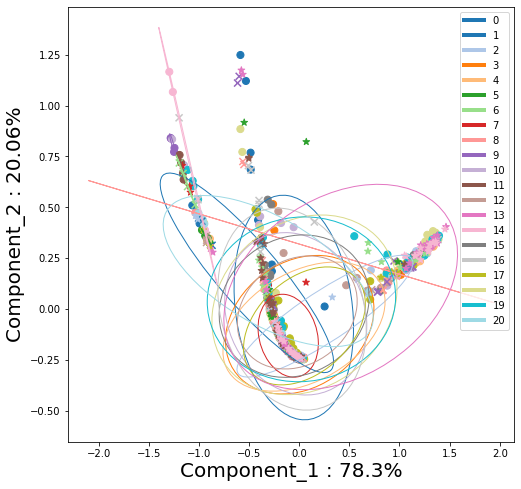

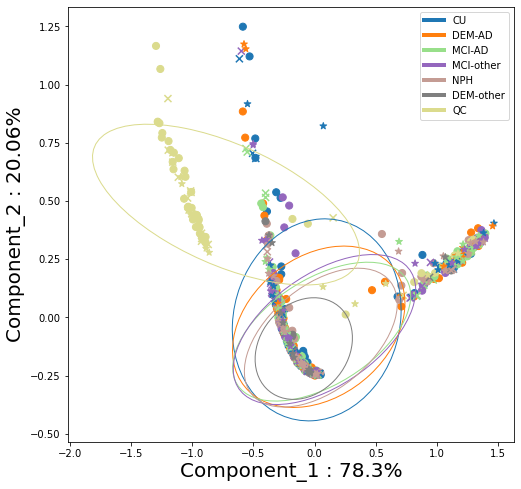

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


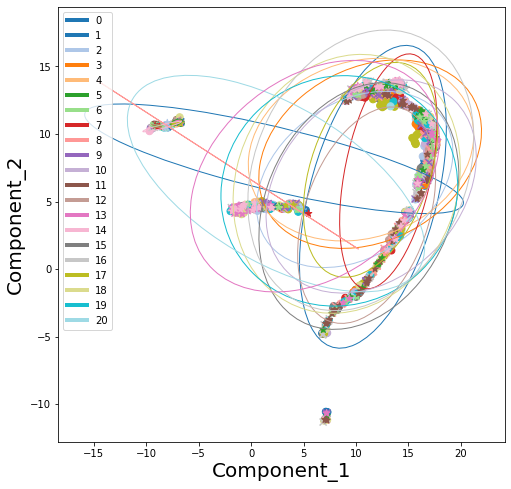

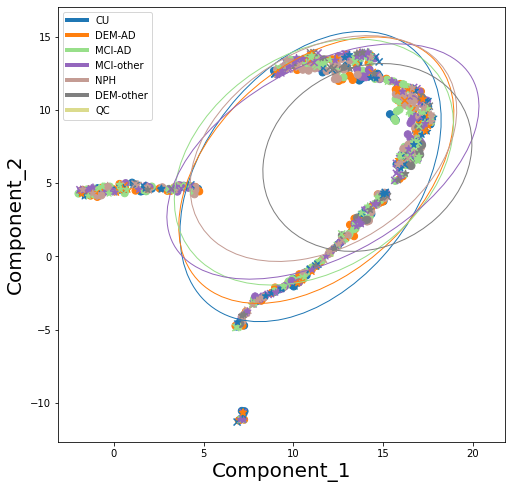

In [ ]:
%matplotlib inline
metrics = log_fct(copy.deepcopy(data), unique_labels, 'vae-revTriplet', metrics)
log_ord(copy.deepcopy(data), unique_labels, unique_batches)
# train_fct(copy.deepcopy(data), n_meta, train_models, 'normae')


# Table

In [ ]:
if log_stuff:
    cols = ['qc_aPCC', '[qc_dist/tot_eucl]', 'lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    # cols_pool = ['pool lisi', 'pool silhouette', 'pool kbet', 'pool shannon', 'pool adjusted_rand_score', 'pool adjusted_mutual_info_score',]
    table = pd.DataFrame(columns=cols, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['valid'][col]

table

,qc_aPCC,[qc_dist/tot_eucl],lisi,silhouette,kbet,shannon,adjusted_rand_score,adjusted_mutual_info_score
raw,0.732741,1.633227,2.563367,-0.045069,0.0,1.873298,0.32577,0.530779
minmax,0.612985,1.655757,4.659393,-0.041588,0.0,1.856461,0.315945,0.520489
minmax_per_batch,0.339852,2.736291,3.498748,0.010096,0.0,1.816375,0.576815,0.723766
standard,0.344475,1.437067,3.795473,-0.070957,0.0,2.000445,0.215521,0.433142
standard_per_batch,0.213869,2.806813,2.557035,-0.057288,0.0,2.307424,0.014325,0.049482
robust,0.254128,1.739949,4.437793,-0.126714,0.00244,2.068903,0.10845,0.315013
robust_per_batch,0.186732,2.247473,4.292547,-0.248365,0.000096,2.328464,0.03113,0.1465
combat,-0.020775,1.110385,1.225609,-0.262312,0.0,2.525115,0.00138,0.006405
pycombat,0.743668,1.855771,2.32185,-0.076422,0.0,2.163173,0.02424,0.126999
harmony,0.751352,1.676539,3.167542,-0.080314,0.0,2.245676,0.00838,0.033595


In [ ]:
models = list(metrics.keys())
cols = ['train_mcc_mean', 'train_mcc_std', 'valid_mcc_mean', 'valid_mcc_std', 'test_mcc_mean', 'test_mcc_std', 'train_acc_mean', 'train_acc_std', 'valid_acc_mean', 'valid_acc_std', 'test_acc_mean', 'test_acc_std']
table = pd.DataFrame(columns=cols, index=models)
for model in models:
    with open(f"results/unique_genes/{model}/linsvc/2/saved_models/best_params_inputs_RF.json", 'r') as f:
        linsvc_res = json.load(f)
    with open(f"results/unique_genes/{model}/rfc/2/saved_models/best_params_inputs_RF.json", 'r') as f:
        rfc_res = json.load(f)
    # if linsvc_res['valid_mcc_mean'] > rfc_res['valid_mcc_mean']:
    results = linsvc_res
    # else:
    #     results = rfc_res
    table['train_mcc_mean'][row] = results['train_mcc_mean']
    table['train_acc_mean'][row] = results['train_acc_mean']
    table['valid_mcc_mean'][row] = results['valid_mcc_mean']
    table['valid_acc_mean'][row] = results['valid_acc_mean']
    table['test_mcc_mean'][row] = results['test_mcc_mean']
    table['test_acc_mean'][row] = results['test_acc_mean']
    table['train_mcc_std'][row] = results['train_mcc_std']
    table['train_acc_std'][row] = results['train_acc_std']
    table['valid_mcc_std'][row] = results['valid_mcc_std']
    table['valid_acc_std'][row] = results['valid_acc_std']
    table['test_mcc_std'][row] = results['test_mcc_std']
    table['test_acc_std'][row] = results['test_acc_std']
table

FileNotFoundError: [Errno 2] No such file or directory: 'results/unique_genes/minmax/linsvc/2/saved_models/best_params_inputs_RF.json'

In [ ]:
table

,train_mcc_mean,train_mcc_std,valid_mcc_mean,valid_mcc_std,test_mcc_mean,test_mcc_std,train_acc_mean,train_acc_std,valid_acc_mean,valid_acc_std,test_acc_mean,test_acc_std
raw,0.695466,0.042043,0.099004,0.05249,0.098459,0.03556,0.743202,0.035023,0.238322,0.03828,0.243165,0.032919
minmax,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
minmax_per_batch,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
standard,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
standard_per_batch,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
robust,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
robust_per_batch,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
combat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pycombat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
harmony,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
